In [152]:
import os
import glob
import subprocess
import shutil
import matplotlib.pyplot as plt
import numpy as np
from scipy.ndimage import gaussian_filter
import pandas as pd
import pickle
from pdf2image import convert_from_path
from PIL import Image
import textwrap

In [39]:
def load_objects_from_file(filename, subfolder=""):
    # Adjust the filename to include the subfolder
    if subfolder:
        filename = os.path.join(subfolder, filename)
        
    # Load the objects from file
    with open(filename, 'rb') as f:
        objects_list = pickle.load(f)
    
    return objects_list

In [40]:
redwood_circle_objects_branch_orig = load_objects_from_file("redwood_circle_objects_orig.pkl", subfolder="object_data")
redwood_circle_objects_branch_origB10th = load_objects_from_file("redwood_circle_objects_origB10th.pkl", subfolder="object_data")
guiana_circle_objects_leaf_orig = load_objects_from_file("guiana_circle_objects_leaf_orig.pkl", subfolder="object_data")
guiana_circle_objects_leaf_div10 = load_objects_from_file("guiana_circle_objects_leaf_div10.pkl", subfolder="object_data")
guiana_circle_objects_leaf_div30 = load_objects_from_file("guiana_circle_objects_leaf_div30.pkl", subfolder="object_data")

In [41]:
def run_gort(input_dir, output_dir, process_dir):
    # Ensure the output directory exists
    os.makedirs(output_dir, exist_ok=True)

    # Find all .in files recursively in the input directory
    fplot = [os.path.join(root, file)
             for root, _, files in os.walk(input_dir)
             for file in files if file.endswith('.in')]

    # Get the current working directory at the start of the script
    initial_dir = os.getcwd()

    # Process each .in file
    for infile in fplot:
        # Get the relative path of the infile with respect to the input directory
        rel_path = os.path.relpath(infile, input_dir)
        
        # Determine the corresponding output file path
        out_file = os.path.join(output_dir, rel_path).replace('.in', '.out')
        
        # Ensure the directory for the output file exists
        os.makedirs(os.path.dirname(out_file), exist_ok=True)
        
        # Copy the input file to gort.in in the process directory
        process_infile = os.path.join(process_dir, 'gort.in')
        shutil.copy(infile, process_infile)
        print(f"Copied {infile} to {process_infile}")
        
        # Change to the process directory
        os.chdir(process_dir)
        
        # Run the Fortran script in the process directory
        cmd_run = './gort_lidar > temp.txt'
        result = subprocess.run(cmd_run, shell=True, capture_output=True, text=True)
        if result.returncode != 0:
            print(f"Error running GORT model: {result.stderr}")
            break
        
        # Move gort.out from the process directory to the corresponding output file path
        process_outfile = os.path.join(process_dir, 'gort.out')
        shutil.move(process_outfile, out_file)
        print(f'Moved {process_outfile} to {out_file}')
        
        # Change back to the initial directory
        os.chdir(initial_dir)
        
# Example usage:
input_directory = '/data/shared/src/STV/LidarSimulation/OrigGORTInput/'  # Replace with your input directory path
output_directory = '/data/shared/src/STV/LidarSimulation/OrigGORTOutput/'  # Replace with your output directory path
process_directory = '/data/shared/src/STV/LidarSimulation/model/'  # Replace with your process directory path

run_gort(input_directory, output_directory, process_directory)

In [278]:
def return_waveform_array(site_version, out_file_identifier):

    if site_version == 'guiana_orig':
        circle_objects = guiana_circle_objects_leaf_orig
        use_branch = False
    elif site_version == 'guiana_orig_with_branch':
        circle_objects = guiana_circle_objects_leaf_orig
        use_branch = True
    elif site_version == 'guiana_origLD10th':
        circle_objects = guiana_circle_objects_leaf_div10
        use_branch = False
    elif site_version == 'guiana_origLD10th_with_branch':
        circle_objects = guiana_circle_objects_leaf_div10
        use_branch = True
    elif site_version == 'guiana_origLD30th':
        circle_objects = guiana_circle_objects_leaf_div30
        use_branch = False
    elif site_version == 'guiana_origLD30th_with_branch':
        circle_objects = guiana_circle_objects_leaf_div30
        use_branch = True
    elif site_version == 'redwood_orig':
        circle_objects = redwood_circle_objects_branch_orig
        use_branch = False
    elif site_version == 'redwood_orig_with_branch':
        circle_objects = redwood_circle_objects_branch_orig
        use_branch = True
    elif site_version == 'redwood_origB10th':
        circle_objects = redwood_circle_objects_branch_origB10th
        use_branch = False
    elif site_version == 'redwood_origB10th_with_branch':
        circle_objects = redwood_circle_objects_branch_origB10th
        use_branch = True
    else:
        raise ValueError(f"Unsupported site_version: {site_version}")

    # Parse out_file_identifier to find the correct circle name
    filename = os.path.basename(out_file_identifier)
    circle_number = filename.split('_')[1:3]  # Assuming 'Circle_1_1_.out' format
    circle_name = f"Circle({circle_number[0]}, {circle_number[1]})"

    # Find the correct circle object
    for circle in circle_objects:
        if circle_name == circle.circle_name:
            height_array = circle.tree_height_array.tolist()
            if use_branch:
                return height_array, circle.waveform_b.tolist()
            else:
                return height_array, circle.waveform.tolist()
            
    raise ValueError(f"{circle_name} not found in {site_version} circle objects.")


def generate_waveform_plots(out_base_dir, subfolder_name, IDL_plots):
    script_dir = os.getcwd()
    
    # Parse the end part of out_base_dir as the folder name
    base_dir_name = os.path.basename(out_base_dir.strip('/'))

    # Ensure the subfolder exists in the current working directory
    save_dir = os.path.join(script_dir, subfolder_name, base_dir_name, "waveform")
    os.makedirs(save_dir, exist_ok=True)
    
    # Get all .out files in the output directory and subdirectories
    out_files = glob.glob(os.path.join(out_base_dir, '**', '*.out'), recursive=True)
    
    # Ensure we have at least 9 .out files to create a 3x3 plot
    if len(out_files) < 9:
        print("Not enough .out files found.")
        return
    
    # Group the .out files into sets of 9
    file_groups = [out_files[i:i + 9] for i in range(0, len(out_files), 9)]
    
    for group_index, file_group in enumerate(file_groups):
        fig, axes = plt.subplots(3, 3, figsize=(8.5, 12))
        
        # Determine the plot filename based on the subfolder names of the .out files
        rel_path = os.path.relpath(file_group[0], out_base_dir)  # Get relative path from out_base_dir
        subfolder_names = rel_path.split(os.sep)[:-1]  # Exclude last segments (filename)
        subfolder_filename = '_'.join(subfolder_names)
        
        # Remove any slashes from the subfolder_filename
        subfolder_filename = subfolder_filename.replace('/', '')
        
        # Set suptitle with enough space at the top
        fig.suptitle(subfolder_filename, y=0.98, fontsize=20)
        
        for idx, out_file in enumerate(file_group):
            row = idx // 3
            col = idx % 3
            
            # Determine the out_file identifier (e.g., Circle_1_1_)
            out_file_identifier = os.path.basename(out_file).split('.')[0]
            # print(out_file_identifier, subfolder_filename)
            
            # Retrieve arrays from return_arrays function
            height_array, new_gort_waveform = return_waveform_array(subfolder_filename, out_file_identifier)
            # print(new_gort_waveform)
            
            # Reading the gort output file
            with open(out_file, 'r') as f:
                gn_level, dz = map(float, f.readline().split())
                n_ext = int(10.0 / dz)
                n_tot = int(gn_level + n_ext)

                ght = np.zeros(n_tot, dtype=np.float32)
                wvfm = np.zeros(n_tot, dtype=np.float32)
                new_gort_ght = np.zeros(len(new_gort_waveform) + n_ext, dtype=np.float32)
                new_gort_waveform_ext = np.zeros(len(new_gort_waveform) + n_ext, dtype=np.float32)
                new_gort_normalized_waveform = np.zeros(len(new_gort_waveform) + n_ext, dtype=np.float32)
                ght[:n_ext] = np.arange(n_ext) * dz - 10  # extend height to below ground 10m deep
                new_gort_ght[:n_ext] = np.arange(n_ext) * dz - 10
                wvfm[:n_ext] = 0  # extend wvfm to below ground 10m deep
                new_gort_waveform_ext[:n_ext] = 0  # extend wvfm to below ground 10m deep

                for _ in range(3):
                    f.readline()  # skip lines

                for ilevel in range(int(gn_level)):
                    line = f.readline().strip()
                    parts = line.split()
                    parts = [float(part) for part in parts]
                    ght[ilevel + n_ext] = parts[0]
                    wvfm[ilevel + n_ext] = parts[-1]
                
                for new_gort_ilevel in range(len(new_gort_waveform)):
                    new_gort_ght[new_gort_ilevel + n_ext] = height_array[new_gort_ilevel]
                    new_gort_waveform_ext[new_gort_ilevel + n_ext] = new_gort_waveform[new_gort_ilevel]
                # print(gn_level, len(new_gort_waveform), len(wvfm))

                width = int(0.6 / dz) + 1
                new_gort_normalized_waveform = gaussian_filter(new_gort_waveform_ext, sigma = width, mode = 'nearest')
                gwvfm_gaussian = gaussian_filter(wvfm, sigma = width, mode = 'nearest')

                axes[row, col].plot(new_gort_normalized_waveform, new_gort_ght, label='New Gort Gaussian Smooth', color='blue')
                axes[row, col].plot(gwvfm_gaussian, ght, label='Old Gort Gaussian Smooth', color='red')
                axes[row, col].set_title(f"{os.path.basename(out_file)}")
                axes[row, col].set_xlabel('Normalized WF')
                axes[row, col].set_ylabel('Height (m)')
                axes[row, col].grid(True, which='both', linestyle='--', linewidth=0.5)
                axes[row, col].minorticks_on()
                axes[row, col].tick_params(labelsize=8, width=1)
                
                # Conditionally set x-axis limits based on subfolder name
                if 'redwood' in subfolder_filename:
                    axes[row, col].set_xlim(0, 0.3)
                elif 'guiana' in subfolder_filename:
                    axes[row, col].set_xlim(0, 0.5)
                    
                axes[row, col].set_ylim(-10, 40)
                # Add legend to the subplot with word wrapping
                handles, labels = axes[row, col].get_legend_handles_labels()
                wrapped_labels = [textwrap.fill(label, width=20) for label in labels]
                axes[row, col].legend(handles, wrapped_labels, loc='lower right', fontsize=8)
                
                
        # Adjust layout and save the plot
        fig.subplots_adjust(left= 0.15, right=0.85, top=0.915, hspace=0.3, wspace=0.68)
        
        plot_filename = os.path.join(save_dir, f"{subfolder_filename}.pdf")
        print(plot_filename)
        
        plt.savefig(plot_filename, bbox_inches='tight')
        plt.show()
        plt.close(fig)  # Close the figure to release memory

        # Find the matching PDF for the subfolder_filename
        matching_pdf_path = recursive_find_pdf(subfolder_filename, IDL_plots)
        print(subfolder_filename)
        print(matching_pdf_path)
        overlay_plot_on_image(matching_pdf_path, plot_filename)

def recursive_find_pdf(subfolder_filename, IDL_plots):
    # Define mappings for subfolder names and PDF names
    subfolder_map = {
        'guiana_orig': ('fg', 'pro_fg_orig', 'fg_f_wvfm.pdf'),
        'guiana_orig_with_branch': ('fg', 'pro_fg_orig', 'fg_fb_wvfm.pdf'),
        'guiana_origLD10th': ('fg', 'pro_fg_origLD10th', 'fg_f_wvfm.pdf'),
        'guiana_origLD10th_with_branch': ('fg', 'pro_fg_origLD10th', 'fg_fb_wvfm.pdf'),
        'guiana_origLD30th': ('fg', 'pro_fg_origLD30th', 'fg_f_wvfm.pdf'),
        'guiana_origLD30th_with_branch': ('fg', 'pro_fg_origLD30th', 'fg_fb_wvfm.pdf'),
        'redwood_orig': ('rw', 'pro_rw_orig', 'rw_f_wvfm.pdf'),
        'redwood_orig_with_branch': ('rw', 'pro_rw_orig', 'rw_fb_wvfm.pdf'),
        'redwood_origB10th': ('rw', 'pro_rw_B10th', 'rw_f_wvfm.pdf'),
        'redwood_origB10th_with_branch': ('rw', 'pro_rw_B10th', 'rw_fb_wvfm.pdf')
    }

    # Search for 'fg' and 'rw' subfolders within IDL_plots
    fg_path = None
    rw_path = None
    for dir_name in os.listdir(IDL_plots):
        if dir_name == 'fg' and os.path.isdir(os.path.join(IDL_plots, dir_name)):
            fg_path = os.path.join(IDL_plots, dir_name)
        elif dir_name == 'rw' and os.path.isdir(os.path.join(IDL_plots, dir_name)):
            rw_path = os.path.join(IDL_plots, dir_name)

    # Retrieve the paths and PDF names from the mapping
    if subfolder_filename in subfolder_map:
        folder_type, subfolder_name, pdf_name = subfolder_map[subfolder_filename]
        if folder_type == 'fg':
            pdf_path = os.path.join(fg_path, subfolder_name, pdf_name)
        elif folder_type == 'rw':
            pdf_path = os.path.join(rw_path, subfolder_name, pdf_name)
    else:
        raise ValueError(f"Unsupported subfolder_filename: {subfolder_filename}")

    # Check if the PDF file exists
    if os.path.exists(pdf_path):
        return pdf_path
    else:
        raise FileNotFoundError(f"PDF file '{pdf_name}' not found at '{pdf_path}'")


def overlay_plot_on_image(original_pdf_path, plot_pdf_path):
    print("original_pdf_path:", original_pdf_path)
    print("plot_pdf_path:", plot_pdf_path)

    # Open original image
    original_image = convert_from_path(original_pdf_path, first_page=1, last_page=1)[0].convert('RGBA')
    
    # Convert plot PDF to image
    plot_image = convert_from_path(plot_pdf_path, first_page=1, last_page=1)[0].convert('RGBA')

    # Print size and other details of the images
    print(f"Original PDF image size: {original_image.size}")
    print(f"Plot PDF image size: {plot_image.size}")
    print(f"Original PDF image format: {original_image.format}")
    print(f"Plot PDF image format: {plot_image.format}")
    print(f"Original PDF image mode: {original_image.mode}")
    print(f"Plot PDF image mode: {plot_image.mode}")
    
    # Resize plot image to match PDF image dimensions
    plot_image = plot_image.resize(original_image.size, Image.LANCZOS)
    print(f"Plot PDF image size: {plot_image.size}")

    # Separate RGB channels
    r, g, b, alpha = original_image.split()
    
    # Calculate average intensity
    average_intensity = Image.eval(original_image, lambda x: int((x[0] + x[1] + x[2]) / 3))

    # Adjust alpha channel based on average intensity
    new_alpha = Image.eval(average_intensity, lambda x: 0 if x > 80 else 255)

    # Composite with the new alpha channel
    original_image = Image.merge("RGBA", (r, g, b, new_alpha))

    # Composite original_image onto plot_image using the alpha mask
    plot_image.paste(original_image, (0, 0), mask=original_image.split()[3])

    # Determine the save path for the combined PDF
    save_pdf_path = plot_pdf_path.replace('IDL_plots', 'overlay_GORT')
    # print(save_pdf_path)

    # Ensure that the directory structure exists
    os.makedirs(os.path.dirname(save_pdf_path), exist_ok=True)
    
    # Save the combined PDF
    plot_image.save(save_pdf_path, save_format='PDF', resolution=100.0, quality=95)

c:\Users\allen\OneDrive\Desktop\Work\Scripts\Lidar Simulation\IDL_plots/2024_07_01\waveform\guiana_orig.pdf


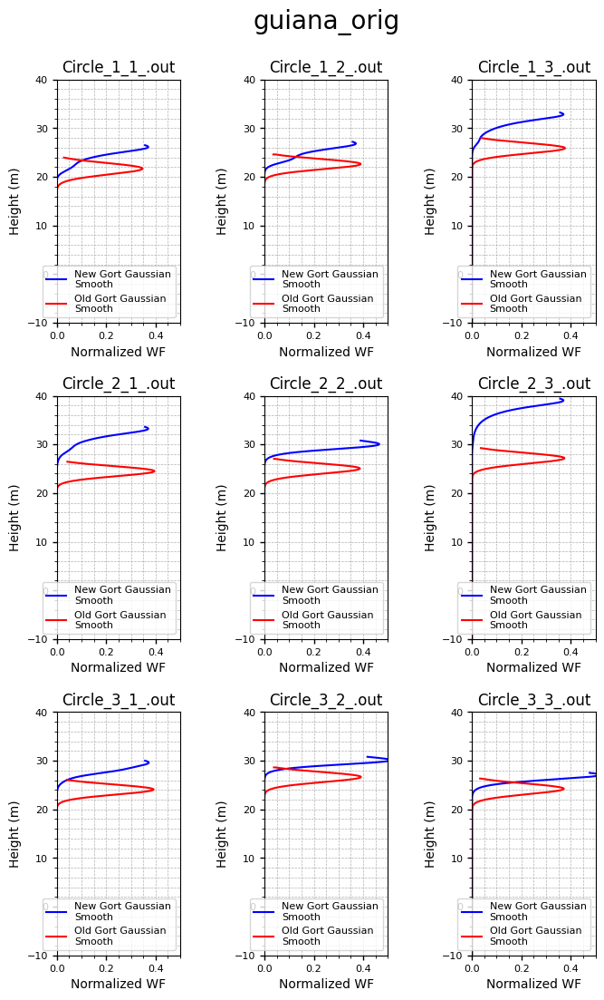

guiana_orig
C:/Users/allen/OneDrive/Desktop/Work/Scripts/Lidar Simulation/gort_model\fg\pro_fg_orig\fg_f_wvfm.pdf
original_pdf_path: C:/Users/allen/OneDrive/Desktop/Work/Scripts/Lidar Simulation/gort_model\fg\pro_fg_orig\fg_f_wvfm.pdf
plot_pdf_path: c:\Users\allen\OneDrive\Desktop\Work\Scripts\Lidar Simulation\IDL_plots/2024_07_01\waveform\guiana_orig.pdf
Original PDF image size: (1653, 2339)
Plot PDF image size: (1335, 2207)
Original PDF image format: None
Plot PDF image format: None
Original PDF image mode: RGBA
Plot PDF image mode: RGBA
Plot PDF image size: (1653, 2339)


TypeError: 'int' object is not subscriptable

In [279]:
gort_out = 'C:/Users/allen/OneDrive/Desktop/Work/Scripts/Lidar Simulation/OrigGORTOutput/2024_07_01'
new_gort_out = 'IDL_plots/'
IDL_plots = 'C:/Users/allen/OneDrive/Desktop/Work/Scripts/Lidar Simulation/gort_model'

generate_waveform_plots(gort_out, new_gort_out, IDL_plots)

In [114]:

def return_Li_dz_array(site_version, out_file_identifier):

    if site_version == 'guiana_orig':
        circle_objects = guiana_circle_objects_leaf_orig
        use_branch = False
    elif site_version == 'guiana_orig_with_branch':
        circle_objects = guiana_circle_objects_leaf_orig
        use_branch = True
    elif site_version == 'guiana_origLD10th':
        circle_objects = guiana_circle_objects_leaf_div10
        use_branch = False
    elif site_version == 'guiana_origLD10th_with_branch':
        circle_objects = guiana_circle_objects_leaf_div10
        use_branch = True
    elif site_version == 'guiana_origLD30th':
        circle_objects = guiana_circle_objects_leaf_div30
        use_branch = False
    elif site_version == 'guiana_origLD30th_with_branch':
        circle_objects = guiana_circle_objects_leaf_div30
        use_branch = True
    elif site_version == 'redwood_orig':
        circle_objects = redwood_circle_objects_branch_orig
        use_branch = False
    elif site_version == 'redwood_orig_with_branch':
        circle_objects = redwood_circle_objects_branch_orig
        use_branch = True
    elif site_version == 'redwood_origB10th':
        circle_objects = redwood_circle_objects_branch_origB10th
        use_branch = False
    elif site_version == 'redwood_origB10th_with_branch':
        circle_objects = redwood_circle_objects_branch_origB10th
        use_branch = True
    else:
        raise ValueError(f"Unsupported site_version: {site_version}")

    # Parse out_file_identifier to find the correct circle name
    filename = os.path.basename(out_file_identifier)
    circle_number = filename.split('_')[1:3]  # Assuming 'Circle_1_1_.out' format
    circle_name = f"Circle({circle_number[0]}, {circle_number[1]})"

    # Find the correct circle object
    for circle in circle_objects:
        if circle_name == circle.circle_name:
            height_array = circle.tree_height_array.tolist()
            if use_branch:
                return height_array, circle.total_Li_dz_branch.tolist()
            else:
                return height_array, circle.total_Li_dz_leaf.tolist()
            
    raise ValueError(f"{circle_name} not found in {site_version} circle objects.")


def generate_fp_plots(out_base_dir, subfolder_name):
    script_dir = os.getcwd()
    
    # Parse the end part of out_base_dir as the folder name
    base_dir_name = os.path.basename(out_base_dir.strip('/'))

    # Ensure the subfolder exists in the current working directory
    save_dir = os.path.join(script_dir, subfolder_name, base_dir_name, "foliage_profile")
    os.makedirs(save_dir, exist_ok=True)
    
    # Get all .out files in the output directory and subdirectories
    out_files = glob.glob(os.path.join(out_base_dir, '**', '*.out'), recursive=True)
    
    # Ensure we have at least 9 .out files to create a 3x3 plot
    if len(out_files) < 9:
        print("Not enough .out files found.")
        return
    
    # Group the .out files into sets of 9
    file_groups = [out_files[i:i + 9] for i in range(0, len(out_files), 9)]
    
    for group_index, file_group in enumerate(file_groups):
        fig, axes = plt.subplots(3, 3, figsize=(15, 15))
        
        # Determine the plot filename based on the subfolder names of the .out files
        rel_path = os.path.relpath(file_group[0], out_base_dir)  # Get relative path from out_base_dir
        subfolder_names = rel_path.split(os.sep)[:-1]  # Exclude last segments (filename)
        subfolder_filename = '_'.join(subfolder_names)
        
        # Remove any slashes from the subfolder_filename
        subfolder_filename = subfolder_filename.replace('/', '')
        
        # Set suptitle with enough space at the top
        fig.suptitle(subfolder_filename, y=0.98, fontsize=24)
        
        for idx, out_file in enumerate(file_group):
            row = idx // 3
            col = idx % 3
            
            # Determine the out_file identifier (e.g., Circle_1_1_)
            out_file_identifier = os.path.basename(out_file).split('.')[0]
            print(out_file_identifier, subfolder_filename)
            
            # Retrieve arrays from return_arrays function
            height_array, new_gort_Li_dz = return_Li_dz_array(subfolder_filename, out_file_identifier)
            
            # Reading the gort output file
            with open(out_file, 'r') as f:
                gn_level, dz = map(float, f.readline().split())
                gn_level = int(gn_level)
                
                ght = np.zeros(gn_level, dtype=np.float32)
                fp = np.zeros(gn_level, dtype=np.float32)
                new_gort_ght = np.zeros(len(new_gort_Li_dz), dtype=np.float32)
                new_gort_fp = np.zeros(len(new_gort_Li_dz), dtype=np.float32)

                for _ in range(3):
                    f.readline()  # skip lines

                for ilevel in range(int(gn_level)):
                    line = f.readline().strip()
                    parts = line.split()
                    parts = [float(part) for part in parts]
                    ght[ilevel] = parts[0]
                    fp[ilevel] = (parts[1]) * 2
                
                for new_gort_ilevel in range(len(new_gort_fp)):
                    new_gort_ght[new_gort_ilevel] = height_array[new_gort_ilevel]
                    new_gort_fp[new_gort_ilevel] = new_gort_Li_dz[new_gort_ilevel]
                # print(gn_level, len(new_gort_waveform), len(wvfm))

                axes[row, col].plot(new_gort_fp, new_gort_ght, label='New Gort Foliage Profile', color='blue')
                axes[row, col].plot(fp, ght, label='Old Gort Foliage Profile', color='red')
                axes[row, col].set_title(f"{os.path.basename(out_file)}")
                axes[row, col].set_xlabel('Foliage Profile (m^2/m^3)')
                axes[row, col].set_ylabel('Height (m)')
                axes[row, col].grid(True, which='both', linestyle='--', linewidth=0.5)
                axes[row, col].minorticks_on()
                axes[row, col].tick_params(labelsize=8, width=1)
                
                # Add legend to the subplot
                axes[row, col].legend()
                
        # Adjust layout and save the plot
        fig.subplots_adjust(top=0.92, hspace=0.4)
        
        plot_filename = os.path.join(save_dir, f"{subfolder_filename}.pdf")
        print(plot_filename)
        
        plt.savefig(plot_filename)
        plt.show()
        plt.close(fig)  # Close the figure to release memory

Circle_1_1_ guiana_orig
Circle_1_2_ guiana_orig
Circle_1_3_ guiana_orig
Circle_2_1_ guiana_orig
Circle_2_2_ guiana_orig
Circle_2_3_ guiana_orig
Circle_3_1_ guiana_orig
Circle_3_2_ guiana_orig
Circle_3_3_ guiana_orig
c:\Users\allen\OneDrive\Desktop\Work\Scripts\Lidar Simulation\IDL_plots/2024_07_01\foliage_profile\guiana_orig.pdf


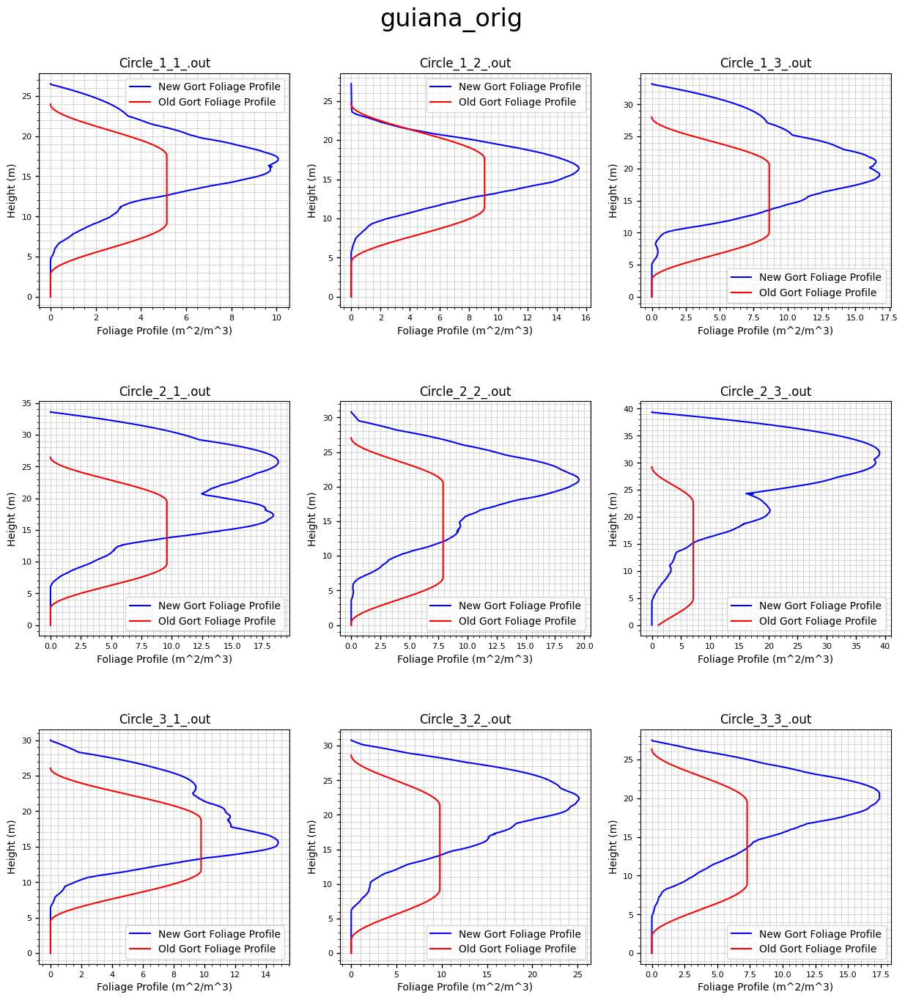

Circle_1_1_branch guiana_orig_with_branch
Circle_1_2_branch guiana_orig_with_branch
Circle_1_3_branch guiana_orig_with_branch
Circle_2_1_branch guiana_orig_with_branch
Circle_2_2_branch guiana_orig_with_branch
Circle_2_3_branch guiana_orig_with_branch
Circle_3_1_branch guiana_orig_with_branch
Circle_3_2_branch guiana_orig_with_branch
Circle_3_3_branch guiana_orig_with_branch
c:\Users\allen\OneDrive\Desktop\Work\Scripts\Lidar Simulation\IDL_plots/2024_07_01\foliage_profile\guiana_orig_with_branch.pdf


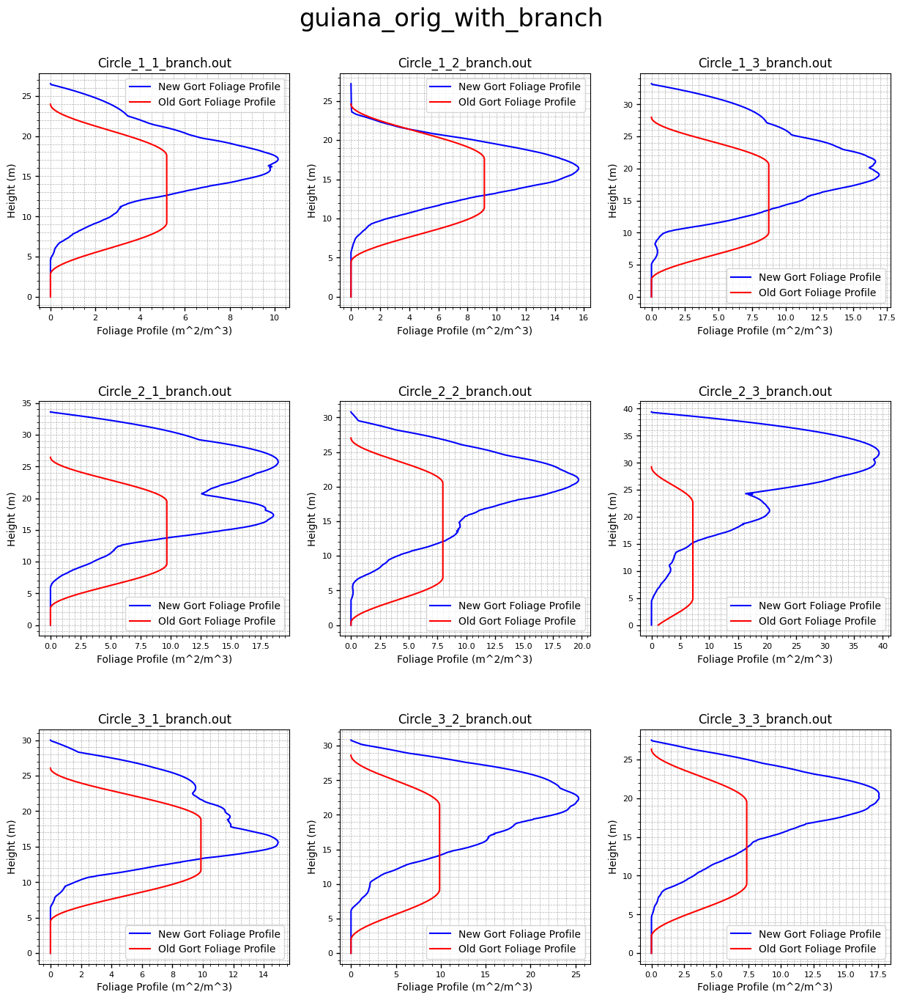

Circle_1_1_ guiana_origLD10th
Circle_1_2_ guiana_origLD10th
Circle_1_3_ guiana_origLD10th
Circle_2_1_ guiana_origLD10th
Circle_2_2_ guiana_origLD10th
Circle_2_3_ guiana_origLD10th
Circle_3_1_ guiana_origLD10th
Circle_3_2_ guiana_origLD10th
Circle_3_3_ guiana_origLD10th
c:\Users\allen\OneDrive\Desktop\Work\Scripts\Lidar Simulation\IDL_plots/2024_07_01\foliage_profile\guiana_origLD10th.pdf


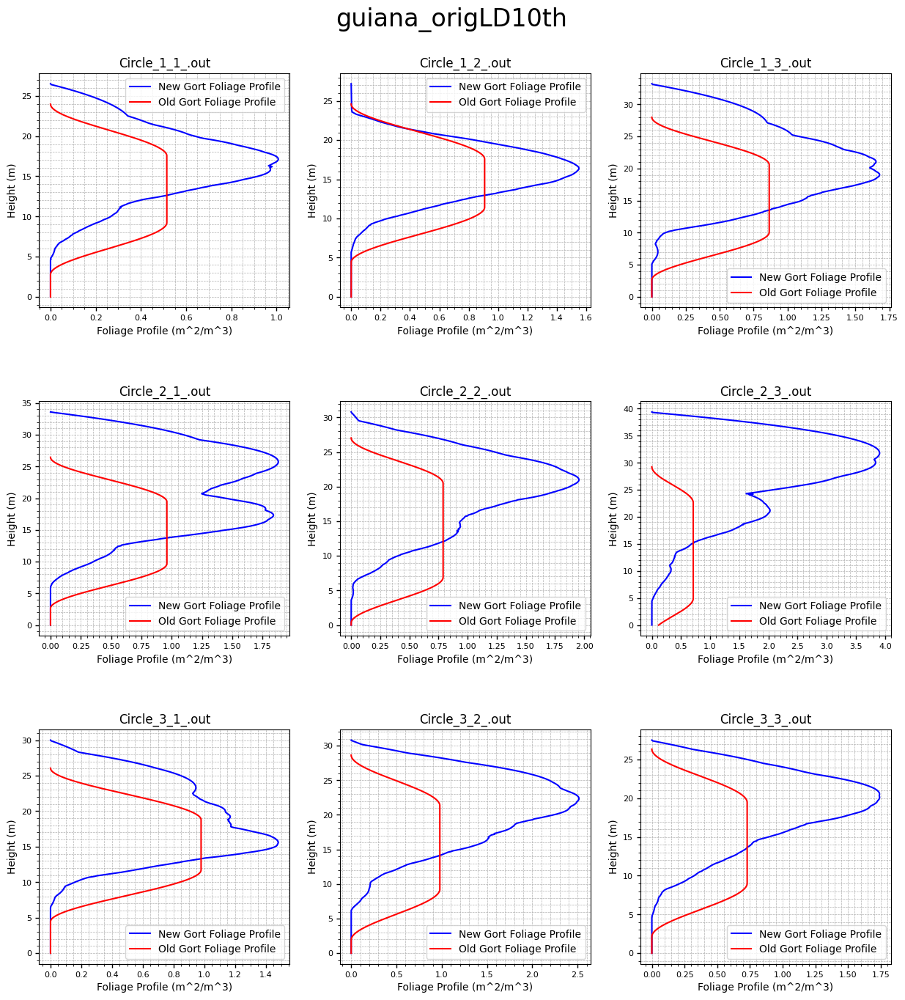

Circle_1_1_branch guiana_origLD10th_with_branch
Circle_1_2_branch guiana_origLD10th_with_branch
Circle_1_3_branch guiana_origLD10th_with_branch
Circle_2_1_branch guiana_origLD10th_with_branch
Circle_2_2_branch guiana_origLD10th_with_branch
Circle_2_3_branch guiana_origLD10th_with_branch
Circle_3_1_branch guiana_origLD10th_with_branch
Circle_3_2_branch guiana_origLD10th_with_branch
Circle_3_3_branch guiana_origLD10th_with_branch
c:\Users\allen\OneDrive\Desktop\Work\Scripts\Lidar Simulation\IDL_plots/2024_07_01\foliage_profile\guiana_origLD10th_with_branch.pdf


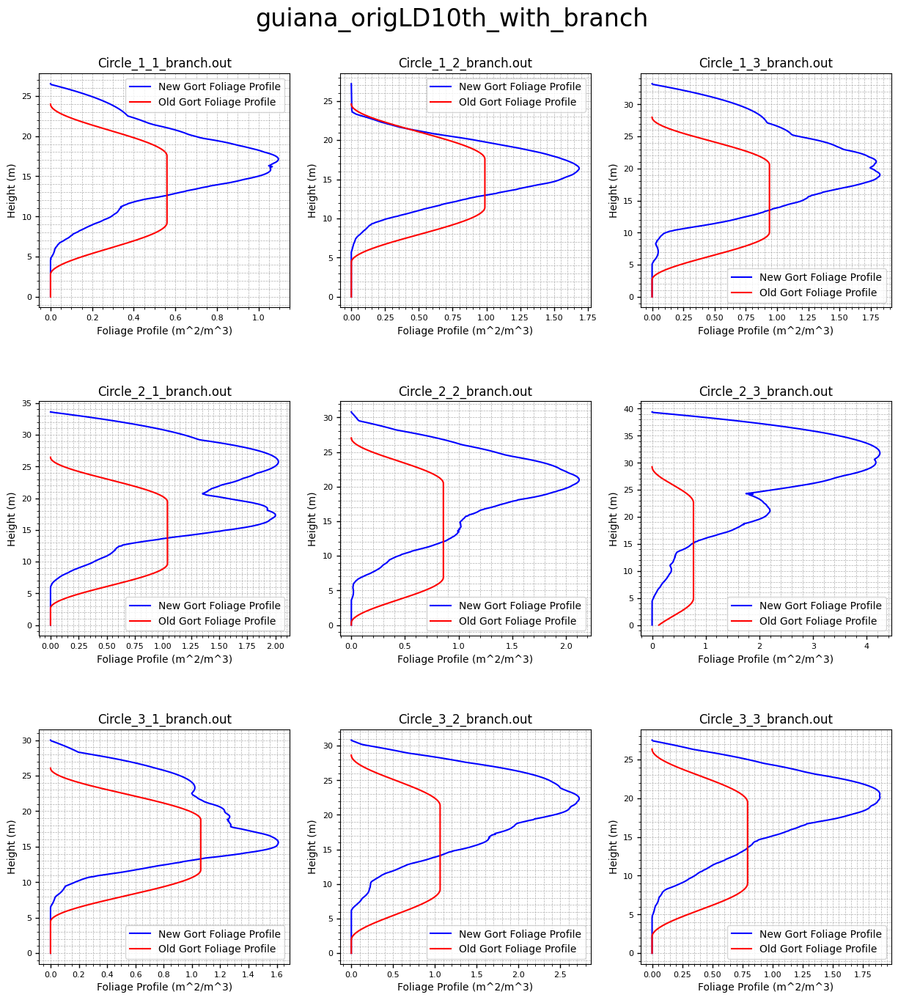

Circle_1_1_ guiana_origLD30th
Circle_1_2_ guiana_origLD30th
Circle_1_3_ guiana_origLD30th
Circle_2_1_ guiana_origLD30th
Circle_2_2_ guiana_origLD30th
Circle_2_3_ guiana_origLD30th
Circle_3_1_ guiana_origLD30th
Circle_3_2_ guiana_origLD30th
Circle_3_3_ guiana_origLD30th
c:\Users\allen\OneDrive\Desktop\Work\Scripts\Lidar Simulation\IDL_plots/2024_07_01\foliage_profile\guiana_origLD30th.pdf


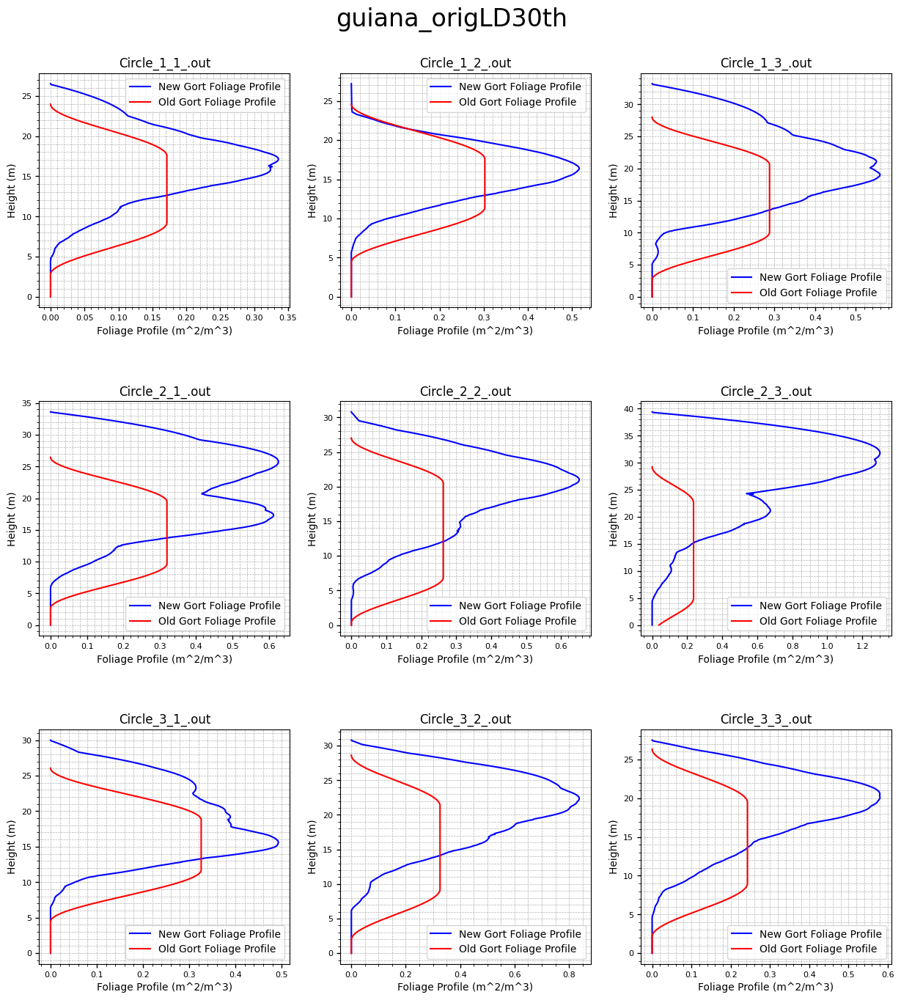

Circle_1_1_branch guiana_origLD30th_with_branch
Circle_1_2_branch guiana_origLD30th_with_branch
Circle_1_3_branch guiana_origLD30th_with_branch
Circle_2_1_branch guiana_origLD30th_with_branch
Circle_2_2_branch guiana_origLD30th_with_branch
Circle_2_3_branch guiana_origLD30th_with_branch
Circle_3_1_branch guiana_origLD30th_with_branch
Circle_3_2_branch guiana_origLD30th_with_branch
Circle_3_3_branch guiana_origLD30th_with_branch
c:\Users\allen\OneDrive\Desktop\Work\Scripts\Lidar Simulation\IDL_plots/2024_07_01\foliage_profile\guiana_origLD30th_with_branch.pdf


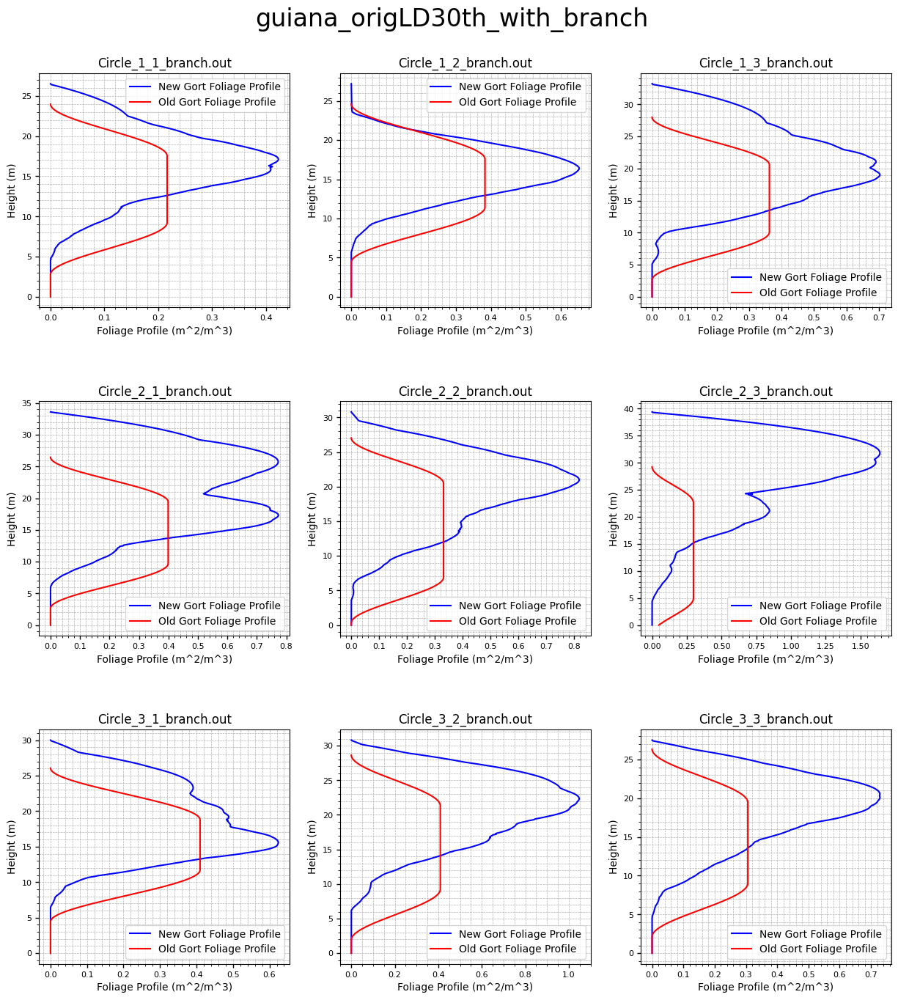

Circle_1_1_ redwood_orig
Circle_1_2_ redwood_orig
Circle_1_3_ redwood_orig
Circle_2_1_ redwood_orig
Circle_2_2_ redwood_orig
Circle_2_3_ redwood_orig
Circle_3_1_ redwood_orig
Circle_3_2_ redwood_orig
Circle_3_3_ redwood_orig
c:\Users\allen\OneDrive\Desktop\Work\Scripts\Lidar Simulation\IDL_plots/2024_07_01\foliage_profile\redwood_orig.pdf


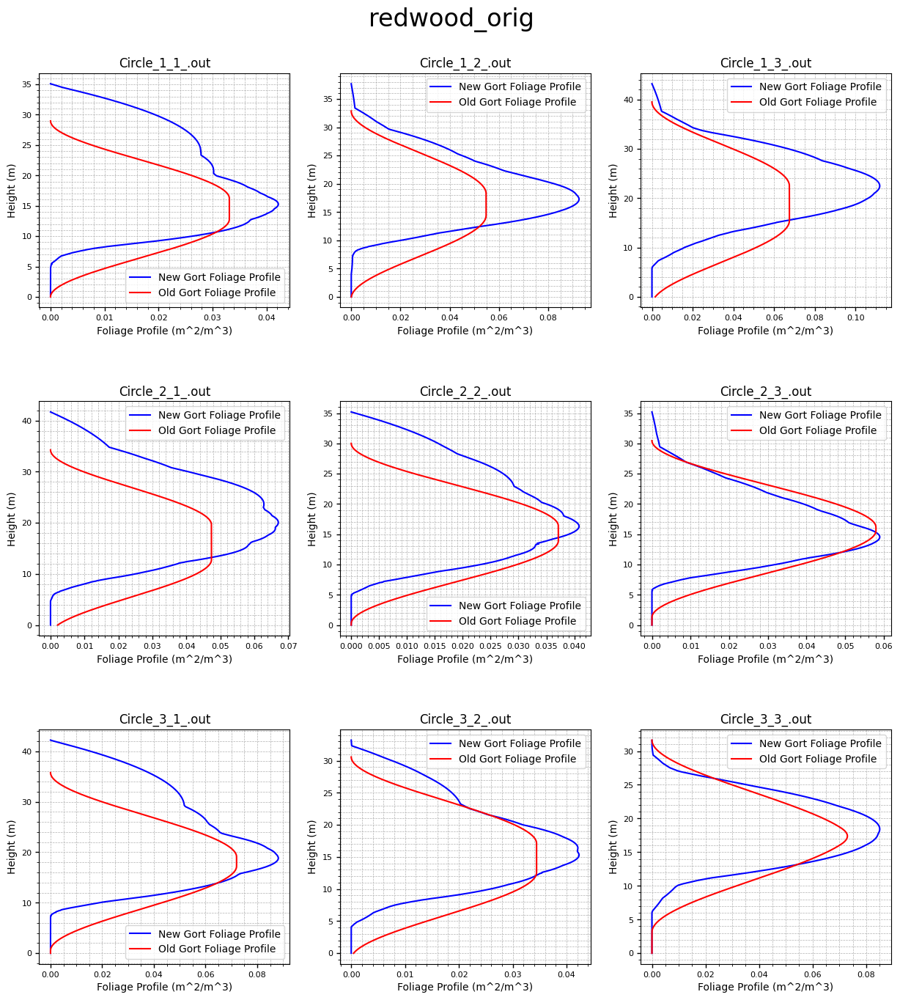

Circle_1_1_branch redwood_orig_with_branch
Circle_1_2_branch redwood_orig_with_branch
Circle_1_3_branch redwood_orig_with_branch
Circle_2_1_branch redwood_orig_with_branch
Circle_2_2_branch redwood_orig_with_branch
Circle_2_3_branch redwood_orig_with_branch
Circle_3_1_branch redwood_orig_with_branch
Circle_3_2_branch redwood_orig_with_branch
Circle_3_3_branch redwood_orig_with_branch
c:\Users\allen\OneDrive\Desktop\Work\Scripts\Lidar Simulation\IDL_plots/2024_07_01\foliage_profile\redwood_orig_with_branch.pdf


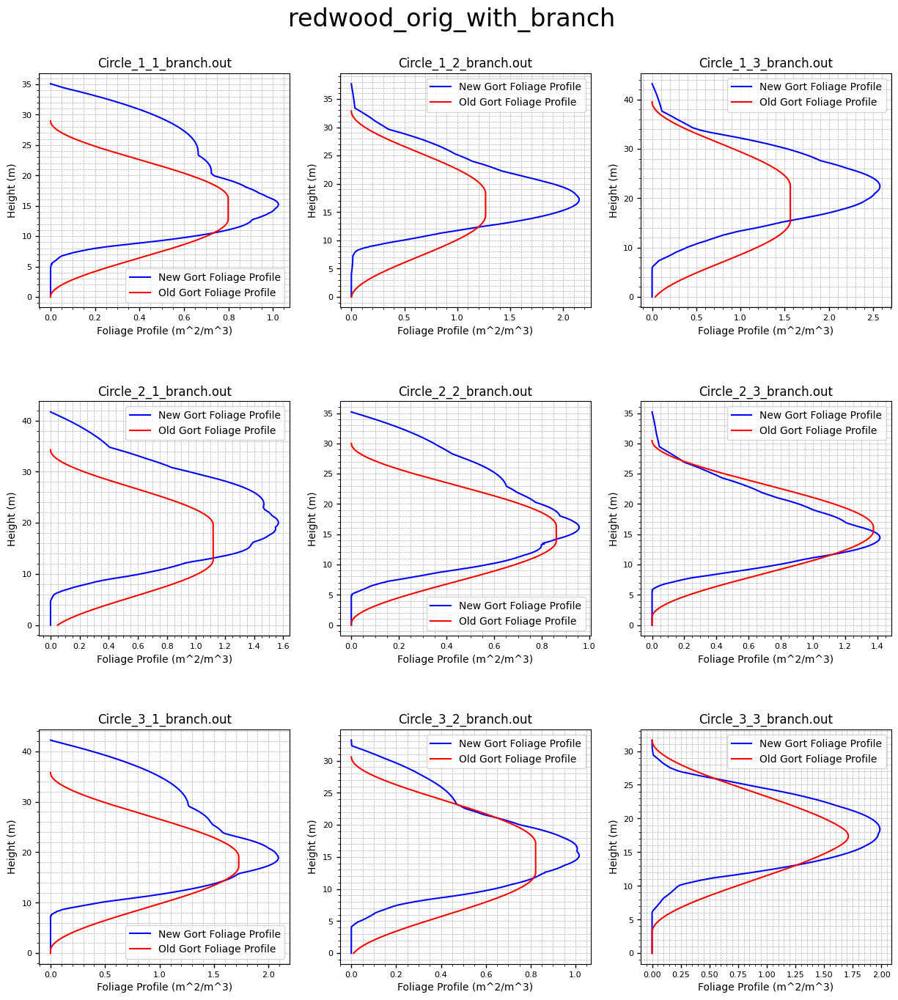

Circle_1_1_ redwood_origB10th
Circle_1_2_ redwood_origB10th
Circle_1_3_ redwood_origB10th
Circle_2_1_ redwood_origB10th
Circle_2_2_ redwood_origB10th
Circle_2_3_ redwood_origB10th
Circle_3_1_ redwood_origB10th
Circle_3_2_ redwood_origB10th
Circle_3_3_ redwood_origB10th
c:\Users\allen\OneDrive\Desktop\Work\Scripts\Lidar Simulation\IDL_plots/2024_07_01\foliage_profile\redwood_origB10th.pdf


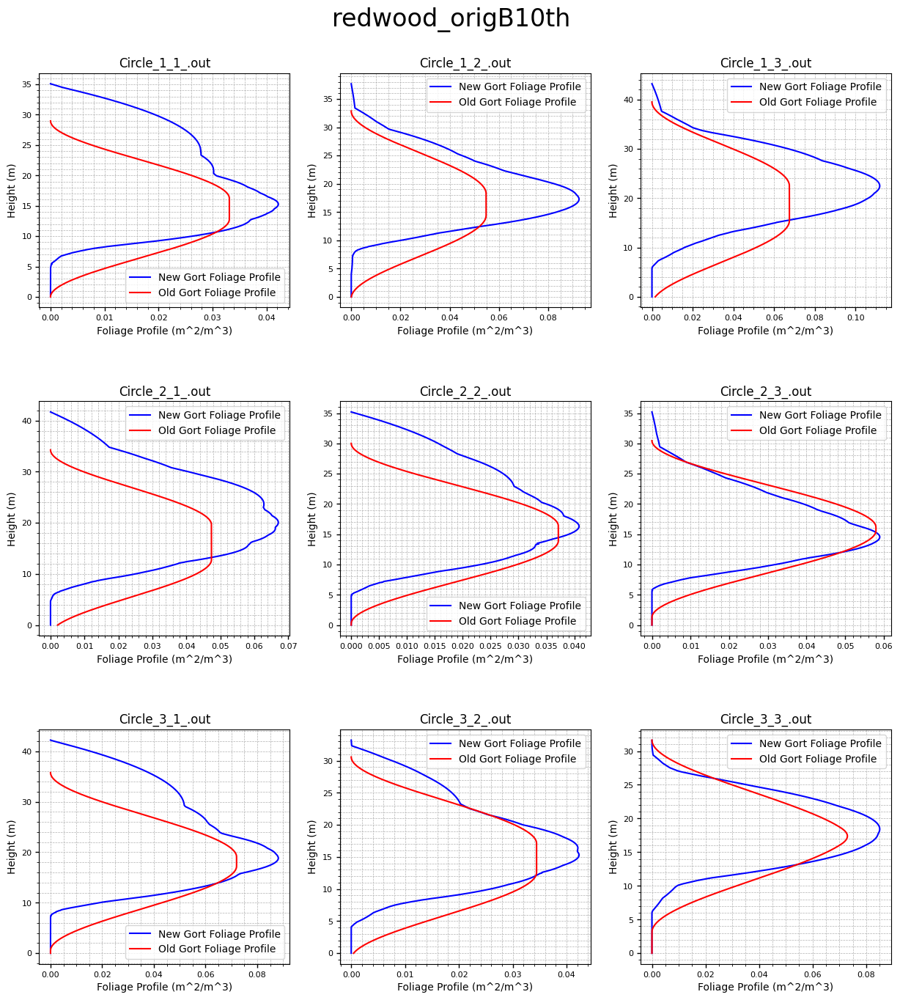

Circle_1_1_branch redwood_origB10th_with_branch
Circle_1_2_branch redwood_origB10th_with_branch
Circle_1_3_branch redwood_origB10th_with_branch
Circle_2_1_branch redwood_origB10th_with_branch
Circle_2_2_branch redwood_origB10th_with_branch
Circle_2_3_branch redwood_origB10th_with_branch
Circle_3_1_branch redwood_origB10th_with_branch
Circle_3_2_branch redwood_origB10th_with_branch
Circle_3_3_branch redwood_origB10th_with_branch
c:\Users\allen\OneDrive\Desktop\Work\Scripts\Lidar Simulation\IDL_plots/2024_07_01\foliage_profile\redwood_origB10th_with_branch.pdf


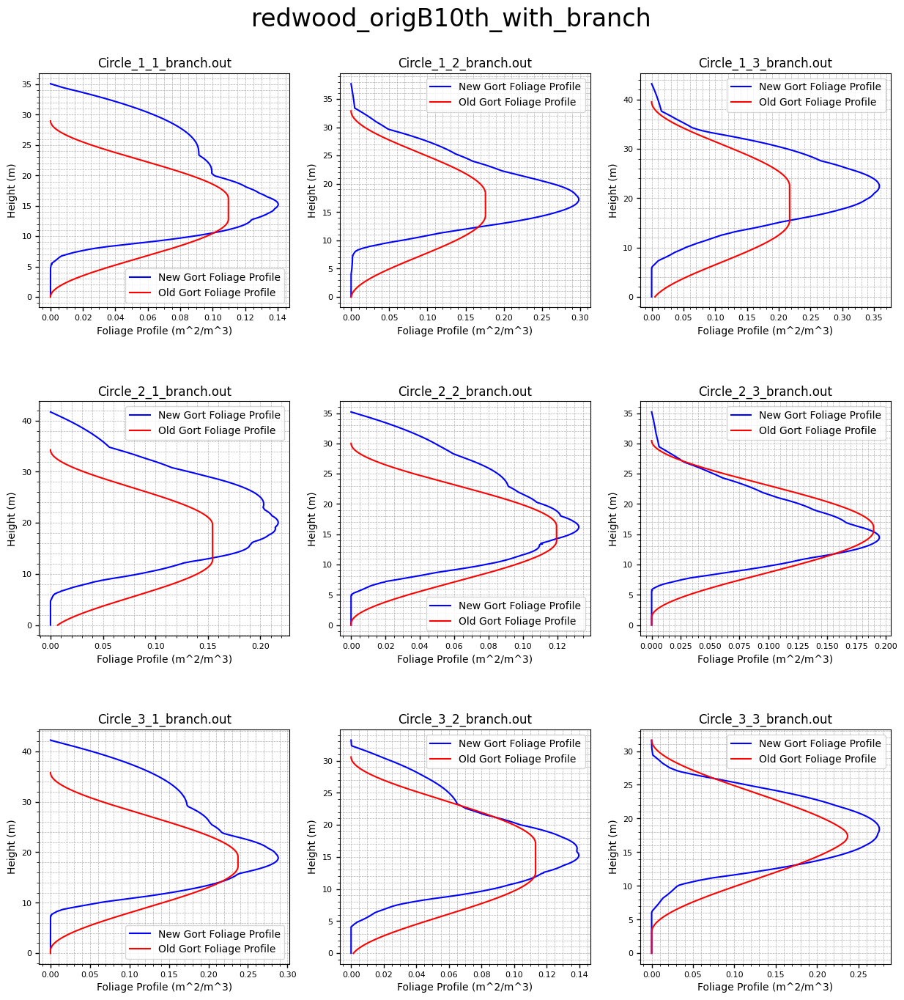

In [45]:
generate_fp_plots('C:/Users/allen/OneDrive/Desktop/Work/Scripts/Lidar Simulation/OrigGORTOutput/2024_07_01', 'IDL_plots/')

In [46]:

def return_acc_LAI_array(site_version, out_file_identifier):

    if site_version == 'guiana_orig':
        circle_objects = guiana_circle_objects_leaf_orig
        use_branch = False
    elif site_version == 'guiana_orig_with_branch':
        circle_objects = guiana_circle_objects_leaf_orig
        use_branch = True
    elif site_version == 'guiana_origLD10th':
        circle_objects = guiana_circle_objects_leaf_div10
        use_branch = False
    elif site_version == 'guiana_origLD10th_with_branch':
        circle_objects = guiana_circle_objects_leaf_div10
        use_branch = True
    elif site_version == 'guiana_origLD30th':
        circle_objects = guiana_circle_objects_leaf_div30
        use_branch = False
    elif site_version == 'guiana_origLD30th_with_branch':
        circle_objects = guiana_circle_objects_leaf_div30
        use_branch = True
    elif site_version == 'redwood_orig':
        circle_objects = redwood_circle_objects_branch_orig
        use_branch = False
    elif site_version == 'redwood_orig_with_branch':
        circle_objects = redwood_circle_objects_branch_orig
        use_branch = True
    elif site_version == 'redwood_origB10th':
        circle_objects = redwood_circle_objects_branch_origB10th
        use_branch = False
    elif site_version == 'redwood_origB10th_with_branch':
        circle_objects = redwood_circle_objects_branch_origB10th
        use_branch = True
    else:
        raise ValueError(f"Unsupported site_version: {site_version}")

    # Parse out_file_identifier to find the correct circle name
    filename = os.path.basename(out_file_identifier)
    circle_number = filename.split('_')[1:3]  # Assuming 'Circle_1_1_.out' format
    circle_name = f"Circle({circle_number[0]}, {circle_number[1]})"

    # Find the correct circle object
    for circle in circle_objects:
        if circle_name == circle.circle_name:
            height_array = circle.tree_height_array.tolist()
            if use_branch:
                return height_array, circle.acc_LAI_leaf.tolist()
            else:
                return height_array, circle.acc_LAI_branch.tolist()
            
    raise ValueError(f"{circle_name} not found in {site_version} circle objects.")


def generate_afp_plots(out_base_dir, subfolder_name):
    script_dir = os.getcwd()
    
    # Parse the end part of out_base_dir as the folder name
    base_dir_name = os.path.basename(out_base_dir.strip('/'))

    # Ensure the subfolder exists in the current working directory
    save_dir = os.path.join(script_dir, subfolder_name, base_dir_name, "acc_LAI")
    os.makedirs(save_dir, exist_ok=True)
    
    # Get all .out files in the output directory and subdirectories
    out_files = glob.glob(os.path.join(out_base_dir, '**', '*.out'), recursive=True)
    
    # Ensure we have at least 9 .out files to create a 3x3 plot
    if len(out_files) < 9:
        print("Not enough .out files found.")
        return
    
    # Group the .out files into sets of 9
    file_groups = [out_files[i:i + 9] for i in range(0, len(out_files), 9)]
    
    for group_index, file_group in enumerate(file_groups):
        fig, axes = plt.subplots(3, 3, figsize=(15, 15))
        
        # Determine the plot filename based on the subfolder names of the .out files
        rel_path = os.path.relpath(file_group[0], out_base_dir)  # Get relative path from out_base_dir
        subfolder_names = rel_path.split(os.sep)[:-1]  # Exclude last segments (filename)
        subfolder_filename = '_'.join(subfolder_names)
        
        # Remove any slashes from the subfolder_filename
        subfolder_filename = subfolder_filename.replace('/', '')
        
        # Set suptitle with enough space at the top
        fig.suptitle(subfolder_filename, y=0.98, fontsize=24)
        
        for idx, out_file in enumerate(file_group):
            row = idx // 3
            col = idx % 3
            
            # Determine the out_file identifier (e.g., Circle_1_1_)
            out_file_identifier = os.path.basename(out_file).split('.')[0]
            print(out_file_identifier, subfolder_filename)
            
            # Retrieve arrays from return_arrays function
            height_array, new_gort_acc_LAI = return_acc_LAI_array(subfolder_filename, out_file_identifier)
            
            # Reading the gort output file
            with open(out_file, 'r') as f:
                gn_level, dz = map(float, f.readline().split())
                gn_level = int(gn_level)
                
                ght = np.zeros(gn_level, dtype=np.float32)
                fp = np.zeros(gn_level, dtype=np.float32)
                new_gort_ght = np.zeros(len(new_gort_acc_LAI), dtype=np.float32)
                new_gort_fp = np.zeros(len(new_gort_acc_LAI), dtype=np.float32)

                for _ in range(3):
                    f.readline()  # skip lines

                for ilevel in range(int(gn_level)):
                    line = f.readline().strip()
                    parts = line.split()
                    parts = [float(part) for part in parts]
                    ght[ilevel] = parts[0]
                    fp[ilevel] = (parts[1]) * 2
                
                # Reverse arrays for cumulative plot
                ght = np.flipud(ght)
                fp = np.flipud(fp)

                cumulative_fp = np.cumsum(fp) * dz
                
                for new_gort_ilevel in range(len(new_gort_fp)):
                    new_gort_ght[new_gort_ilevel] = height_array[new_gort_ilevel]
                    new_gort_fp[new_gort_ilevel] = new_gort_acc_LAI[new_gort_ilevel]
                # print(gn_level, len(new_gort_waveform), len(wvfm))

                axes[row, col].plot(new_gort_fp, new_gort_ght, label='New Gort Accumulated LAI', color='blue')
                axes[row, col].plot(cumulative_fp, ght, label='Old Gort afp', color='red')
                axes[row, col].set_title(f"{os.path.basename(out_file)}")
                axes[row, col].set_xlabel('Foliage Profile (m^2/m^3)')
                axes[row, col].set_ylabel('Height (m)')
                axes[row, col].grid(True, which='both', linestyle='--', linewidth=0.5)
                axes[row, col].minorticks_on()
                axes[row, col].tick_params(labelsize=8, width=1)
                
                # Add legend to the subplot
                axes[row, col].legend()
                
        # Adjust layout and save the plot
        fig.subplots_adjust(top=0.92, hspace=0.4)
        
        plot_filename = os.path.join(save_dir, f"{subfolder_filename}.pdf")
        print(plot_filename)
        
        plt.savefig(plot_filename)
        plt.show()
        plt.close(fig)  # Close the figure to release memory

Circle_1_1_ guiana_orig
Circle_1_2_ guiana_orig
Circle_1_3_ guiana_orig
Circle_2_1_ guiana_orig
Circle_2_2_ guiana_orig
Circle_2_3_ guiana_orig
Circle_3_1_ guiana_orig
Circle_3_2_ guiana_orig
Circle_3_3_ guiana_orig
c:\Users\allen\OneDrive\Desktop\Work\Scripts\Lidar Simulation\IDL_plots/2024_07_01\acc_LAI\guiana_orig.pdf


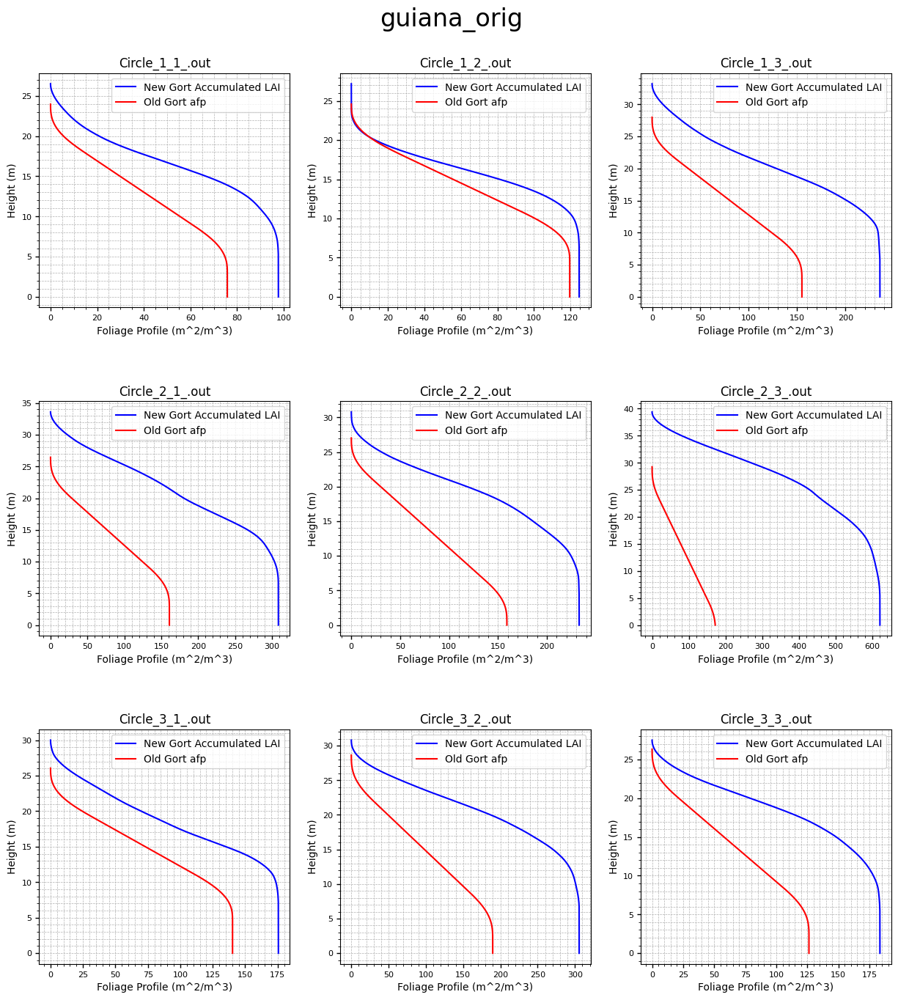

Circle_1_1_branch guiana_orig_with_branch
Circle_1_2_branch guiana_orig_with_branch
Circle_1_3_branch guiana_orig_with_branch
Circle_2_1_branch guiana_orig_with_branch
Circle_2_2_branch guiana_orig_with_branch
Circle_2_3_branch guiana_orig_with_branch
Circle_3_1_branch guiana_orig_with_branch
Circle_3_2_branch guiana_orig_with_branch
Circle_3_3_branch guiana_orig_with_branch
c:\Users\allen\OneDrive\Desktop\Work\Scripts\Lidar Simulation\IDL_plots/2024_07_01\acc_LAI\guiana_orig_with_branch.pdf


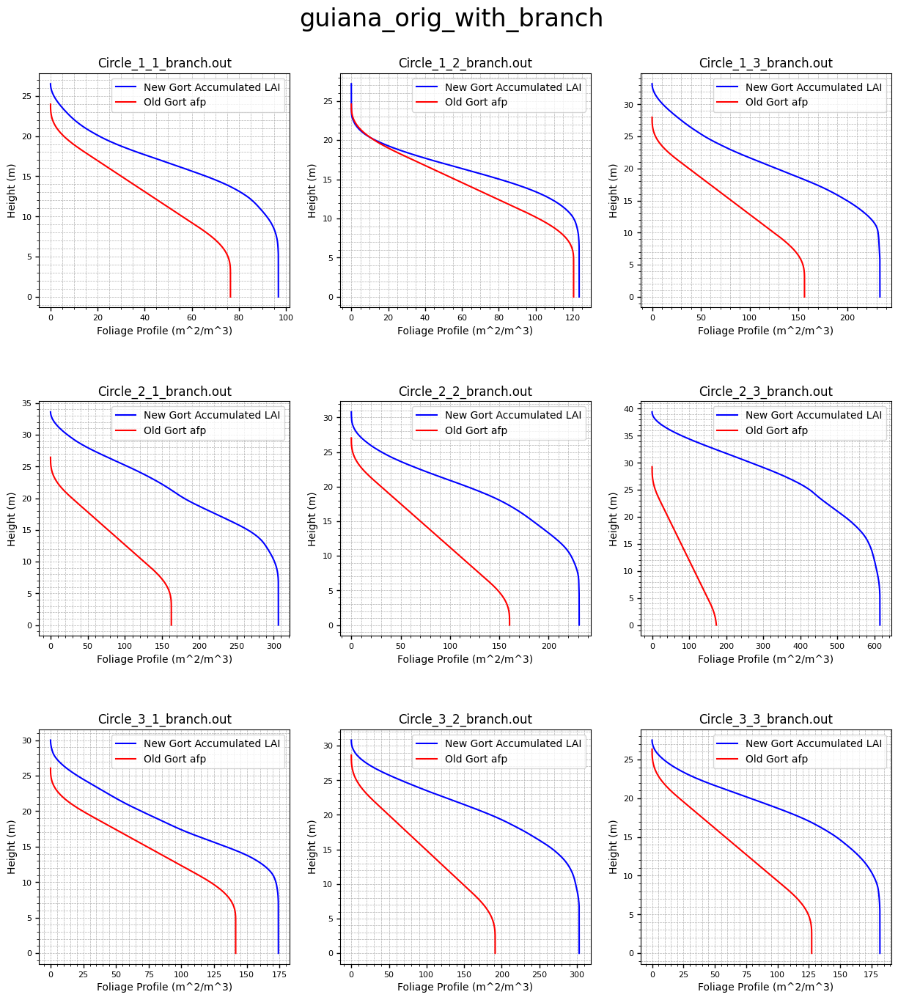

Circle_1_1_ guiana_origLD10th
Circle_1_2_ guiana_origLD10th
Circle_1_3_ guiana_origLD10th
Circle_2_1_ guiana_origLD10th
Circle_2_2_ guiana_origLD10th
Circle_2_3_ guiana_origLD10th
Circle_3_1_ guiana_origLD10th
Circle_3_2_ guiana_origLD10th
Circle_3_3_ guiana_origLD10th
c:\Users\allen\OneDrive\Desktop\Work\Scripts\Lidar Simulation\IDL_plots/2024_07_01\acc_LAI\guiana_origLD10th.pdf


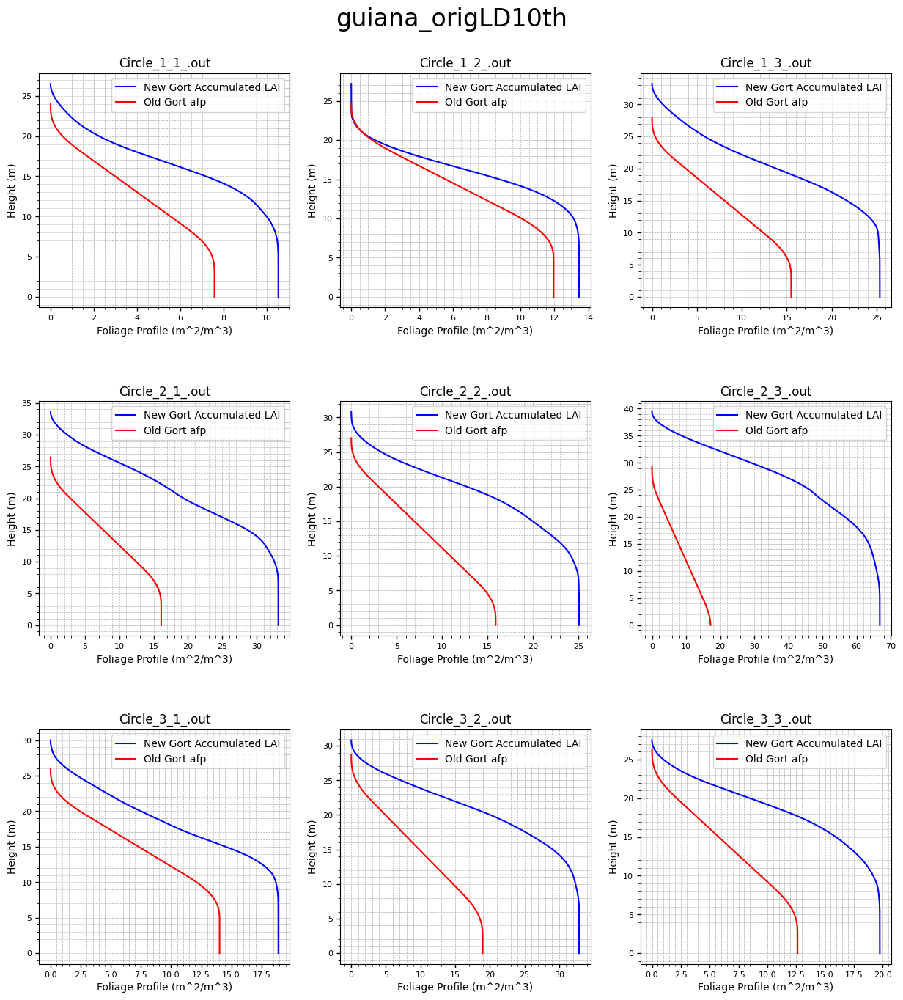

Circle_1_1_branch guiana_origLD10th_with_branch
Circle_1_2_branch guiana_origLD10th_with_branch
Circle_1_3_branch guiana_origLD10th_with_branch
Circle_2_1_branch guiana_origLD10th_with_branch
Circle_2_2_branch guiana_origLD10th_with_branch
Circle_2_3_branch guiana_origLD10th_with_branch
Circle_3_1_branch guiana_origLD10th_with_branch
Circle_3_2_branch guiana_origLD10th_with_branch
Circle_3_3_branch guiana_origLD10th_with_branch
c:\Users\allen\OneDrive\Desktop\Work\Scripts\Lidar Simulation\IDL_plots/2024_07_01\acc_LAI\guiana_origLD10th_with_branch.pdf


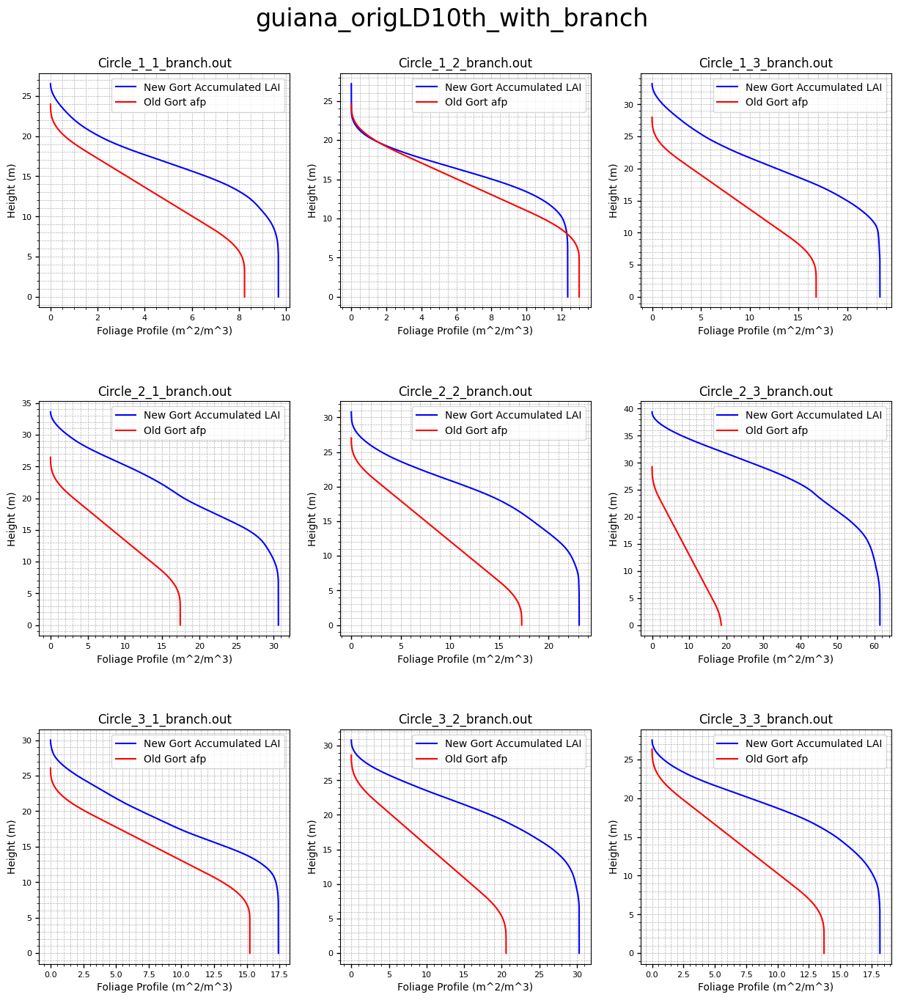

Circle_1_1_ guiana_origLD30th
Circle_1_2_ guiana_origLD30th
Circle_1_3_ guiana_origLD30th
Circle_2_1_ guiana_origLD30th
Circle_2_2_ guiana_origLD30th
Circle_2_3_ guiana_origLD30th
Circle_3_1_ guiana_origLD30th
Circle_3_2_ guiana_origLD30th
Circle_3_3_ guiana_origLD30th
c:\Users\allen\OneDrive\Desktop\Work\Scripts\Lidar Simulation\IDL_plots/2024_07_01\acc_LAI\guiana_origLD30th.pdf


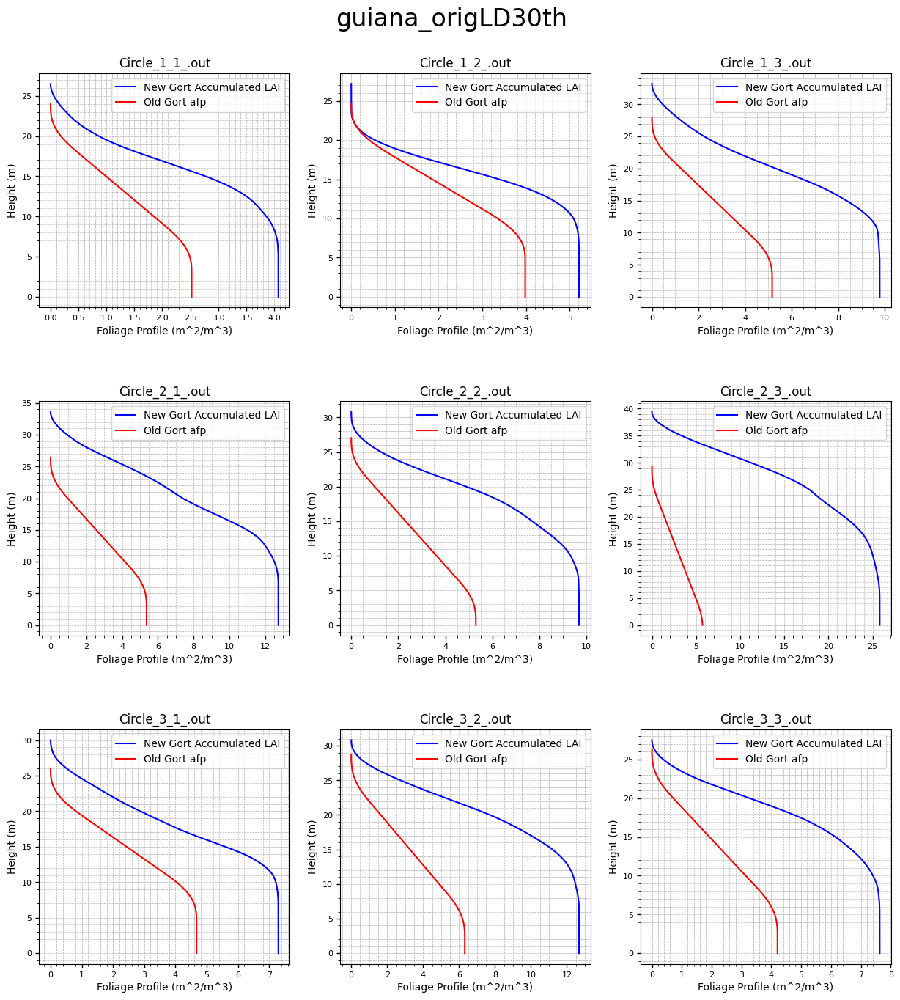

Circle_1_1_branch guiana_origLD30th_with_branch
Circle_1_2_branch guiana_origLD30th_with_branch
Circle_1_3_branch guiana_origLD30th_with_branch
Circle_2_1_branch guiana_origLD30th_with_branch
Circle_2_2_branch guiana_origLD30th_with_branch
Circle_2_3_branch guiana_origLD30th_with_branch
Circle_3_1_branch guiana_origLD30th_with_branch
Circle_3_2_branch guiana_origLD30th_with_branch
Circle_3_3_branch guiana_origLD30th_with_branch
c:\Users\allen\OneDrive\Desktop\Work\Scripts\Lidar Simulation\IDL_plots/2024_07_01\acc_LAI\guiana_origLD30th_with_branch.pdf


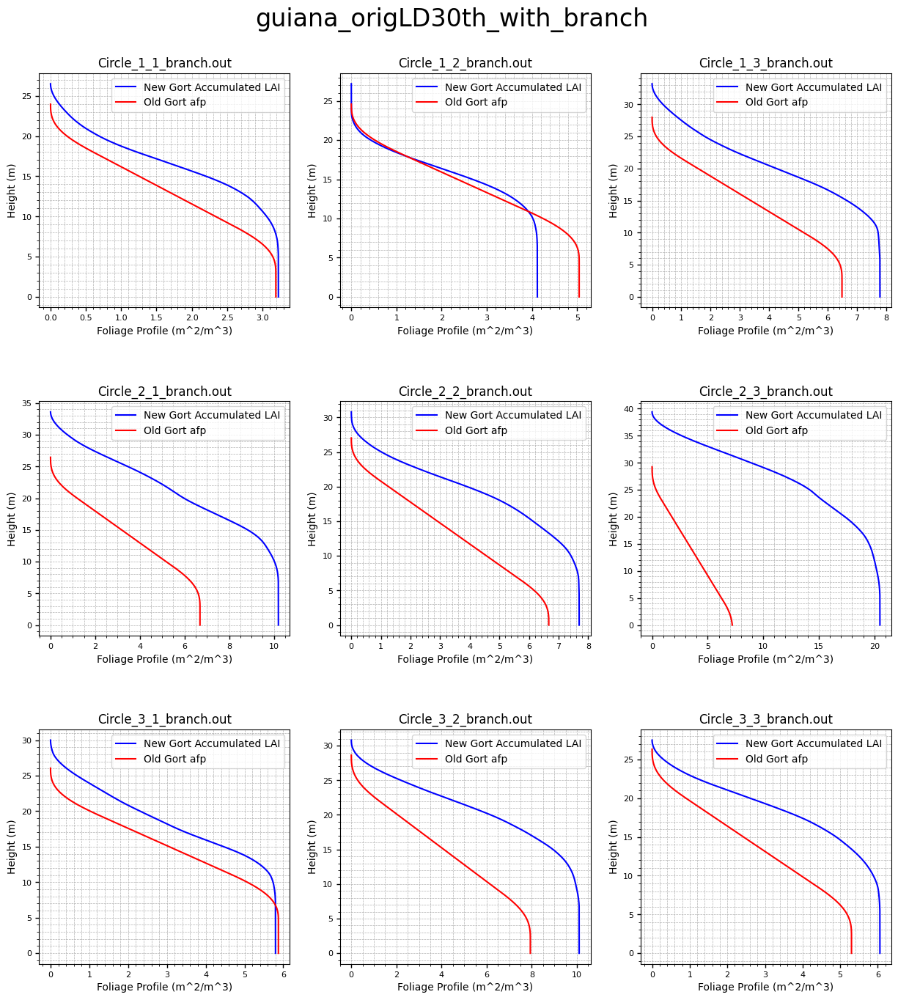

Circle_1_1_ redwood_orig
Circle_1_2_ redwood_orig
Circle_1_3_ redwood_orig
Circle_2_1_ redwood_orig
Circle_2_2_ redwood_orig
Circle_2_3_ redwood_orig
Circle_3_1_ redwood_orig
Circle_3_2_ redwood_orig
Circle_3_3_ redwood_orig
c:\Users\allen\OneDrive\Desktop\Work\Scripts\Lidar Simulation\IDL_plots/2024_07_01\acc_LAI\redwood_orig.pdf


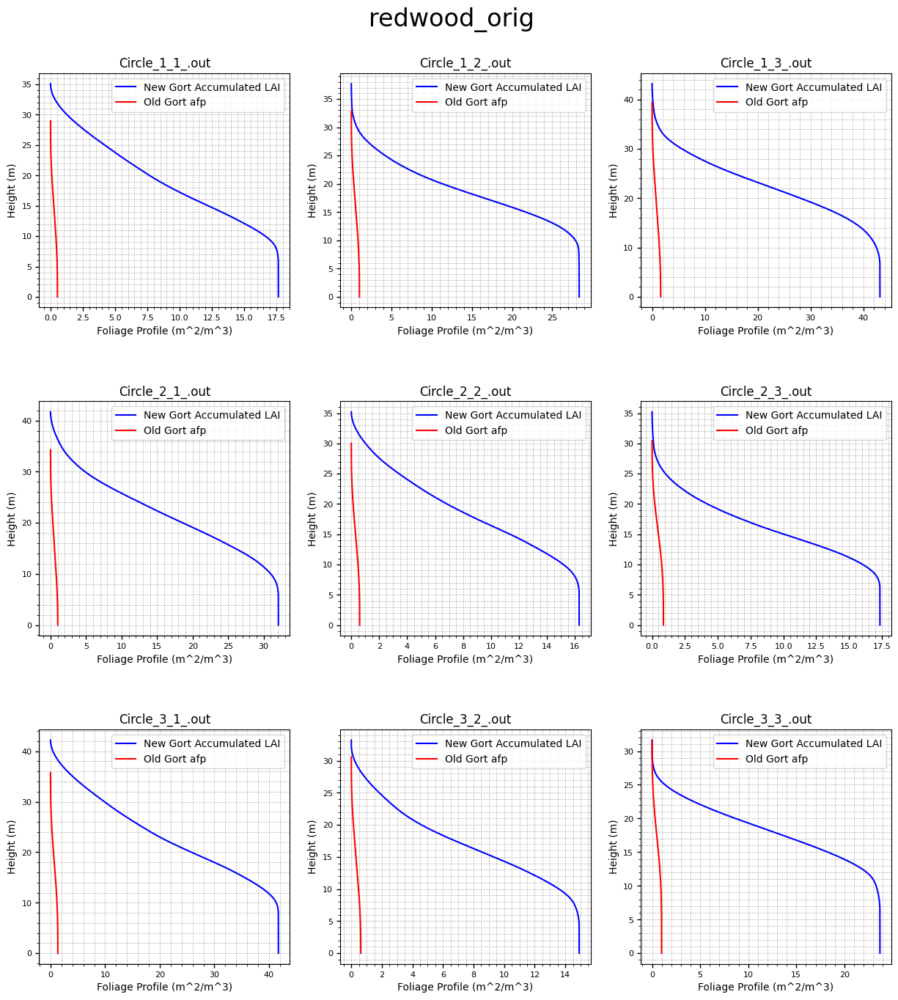

Circle_1_1_branch redwood_orig_with_branch
Circle_1_2_branch redwood_orig_with_branch
Circle_1_3_branch redwood_orig_with_branch
Circle_2_1_branch redwood_orig_with_branch
Circle_2_2_branch redwood_orig_with_branch
Circle_2_3_branch redwood_orig_with_branch
Circle_3_1_branch redwood_orig_with_branch
Circle_3_2_branch redwood_orig_with_branch
Circle_3_3_branch redwood_orig_with_branch
c:\Users\allen\OneDrive\Desktop\Work\Scripts\Lidar Simulation\IDL_plots/2024_07_01\acc_LAI\redwood_orig_with_branch.pdf


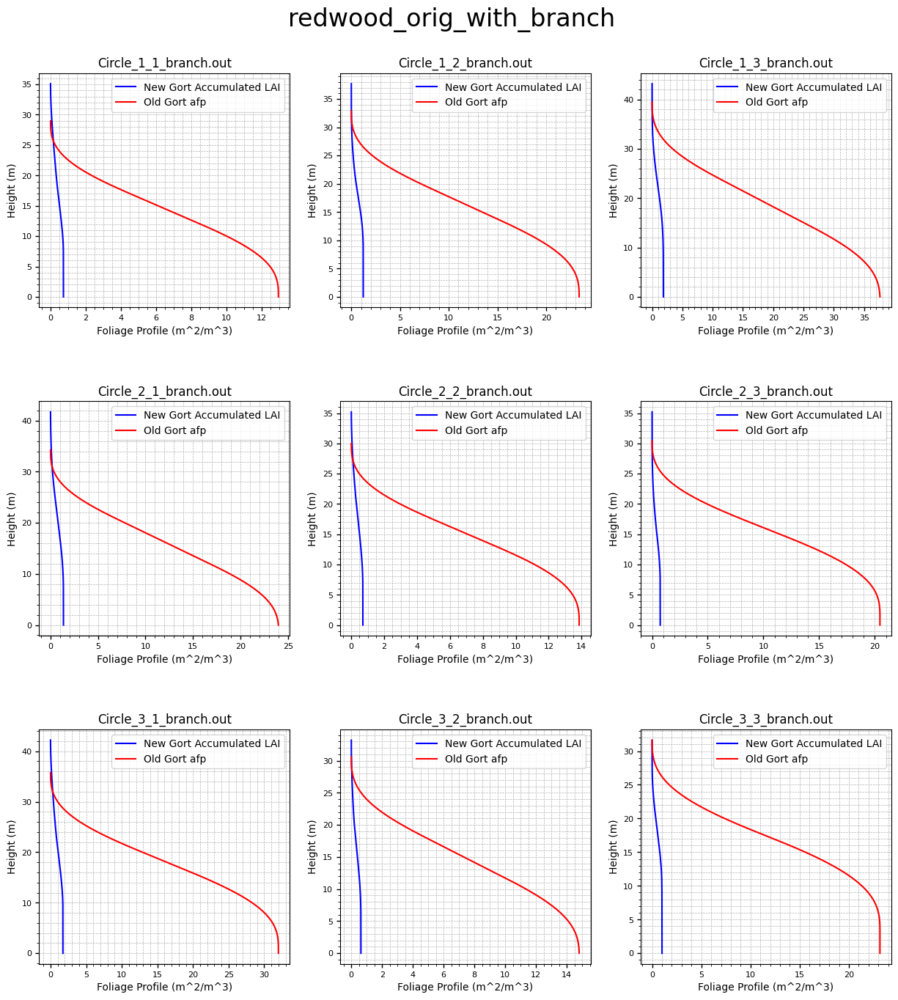

Circle_1_1_ redwood_origB10th
Circle_1_2_ redwood_origB10th
Circle_1_3_ redwood_origB10th
Circle_2_1_ redwood_origB10th
Circle_2_2_ redwood_origB10th
Circle_2_3_ redwood_origB10th
Circle_3_1_ redwood_origB10th
Circle_3_2_ redwood_origB10th
Circle_3_3_ redwood_origB10th
c:\Users\allen\OneDrive\Desktop\Work\Scripts\Lidar Simulation\IDL_plots/2024_07_01\acc_LAI\redwood_origB10th.pdf


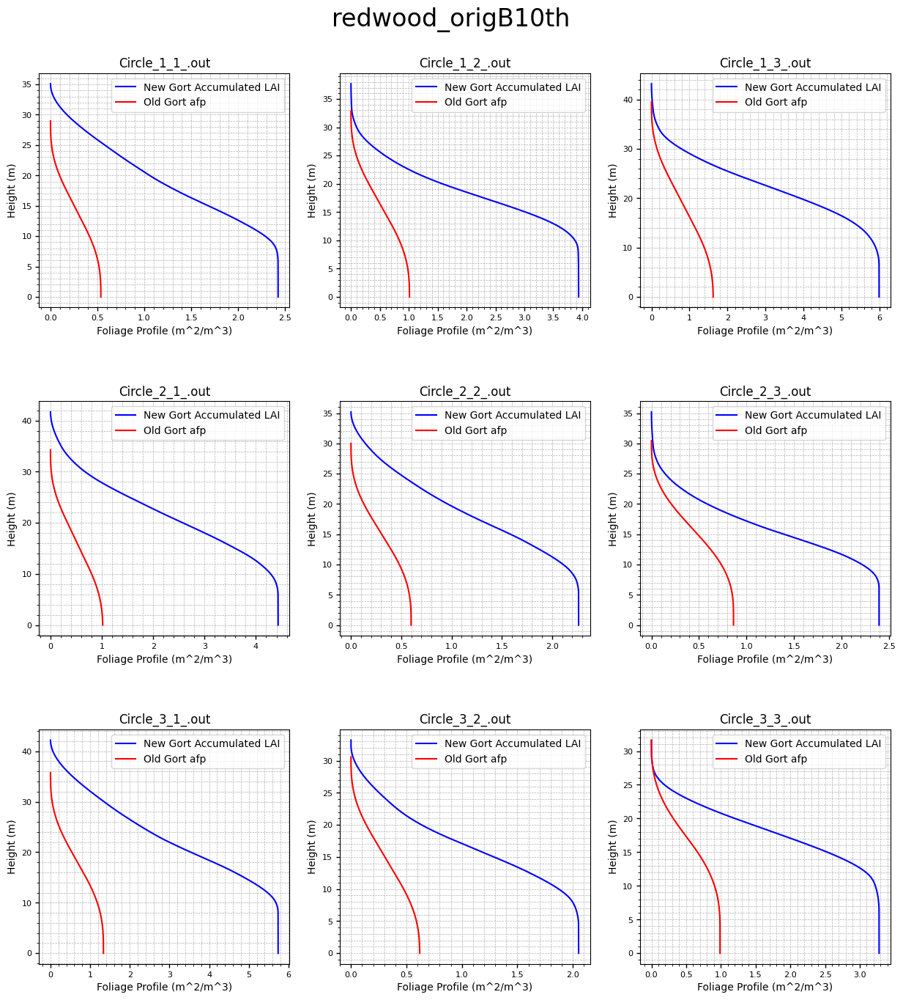

Circle_1_1_branch redwood_origB10th_with_branch
Circle_1_2_branch redwood_origB10th_with_branch
Circle_1_3_branch redwood_origB10th_with_branch
Circle_2_1_branch redwood_origB10th_with_branch
Circle_2_2_branch redwood_origB10th_with_branch
Circle_2_3_branch redwood_origB10th_with_branch
Circle_3_1_branch redwood_origB10th_with_branch
Circle_3_2_branch redwood_origB10th_with_branch
Circle_3_3_branch redwood_origB10th_with_branch
c:\Users\allen\OneDrive\Desktop\Work\Scripts\Lidar Simulation\IDL_plots/2024_07_01\acc_LAI\redwood_origB10th_with_branch.pdf


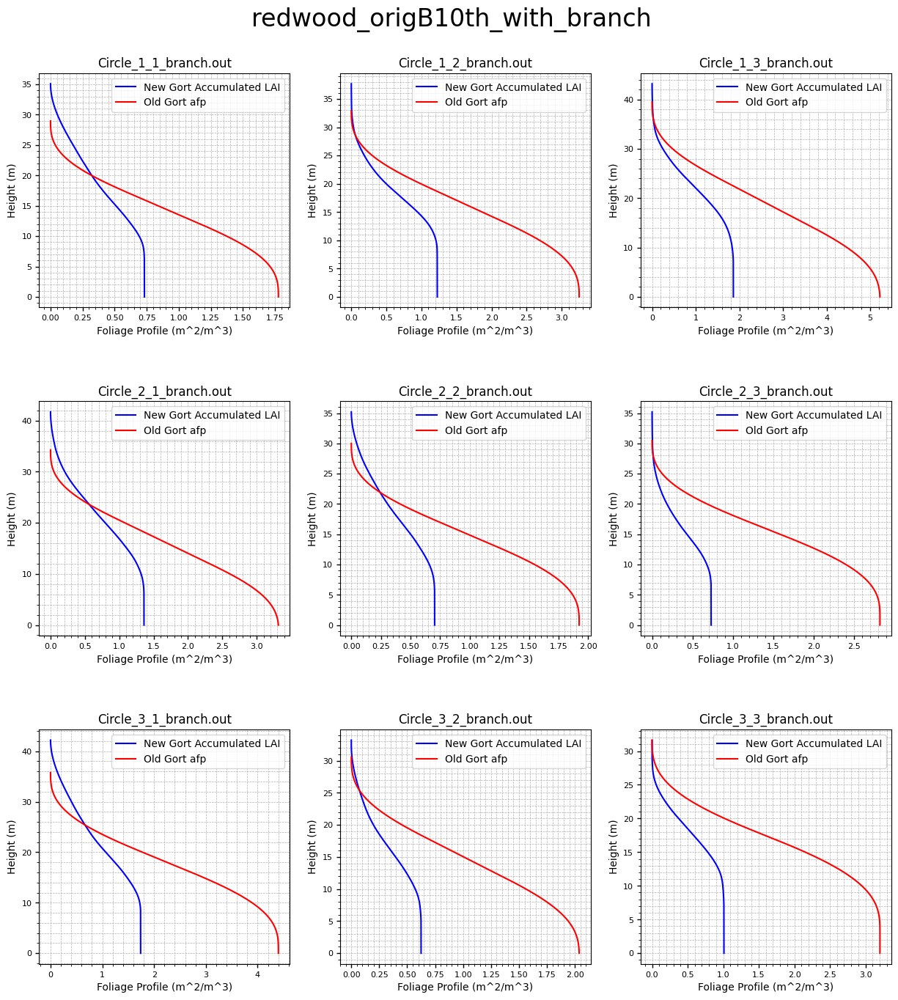

In [47]:
generate_afp_plots('C:/Users/allen/OneDrive/Desktop/Work/Scripts/Lidar Simulation/OrigGORTOutput/2024_07_01', 'IDL_plots/')

In [48]:

def return_pgap_array(site_version, out_file_identifier):

    if site_version == 'guiana_orig':
        circle_objects = guiana_circle_objects_leaf_orig
        use_branch = False
    elif site_version == 'guiana_orig_with_branch':
        circle_objects = guiana_circle_objects_leaf_orig
        use_branch = True
    elif site_version == 'guiana_origLD10th':
        circle_objects = guiana_circle_objects_leaf_div10
        use_branch = False
    elif site_version == 'guiana_origLD10th_with_branch':
        circle_objects = guiana_circle_objects_leaf_div10
        use_branch = True
    elif site_version == 'guiana_origLD30th':
        circle_objects = guiana_circle_objects_leaf_div30
        use_branch = False
    elif site_version == 'guiana_origLD30th_with_branch':
        circle_objects = guiana_circle_objects_leaf_div30
        use_branch = True
    elif site_version == 'redwood_orig':
        circle_objects = redwood_circle_objects_branch_orig
        use_branch = False
    elif site_version == 'redwood_orig_with_branch':
        circle_objects = redwood_circle_objects_branch_orig
        use_branch = True
    elif site_version == 'redwood_origB10th':
        circle_objects = redwood_circle_objects_branch_origB10th
        use_branch = False
    elif site_version == 'redwood_origB10th_with_branch':
        circle_objects = redwood_circle_objects_branch_origB10th
        use_branch = True
    else:
        raise ValueError(f"Unsupported site_version: {site_version}")

    # Parse out_file_identifier to find the correct circle name
    filename = os.path.basename(out_file_identifier)
    circle_number = filename.split('_')[1:3]  # Assuming 'Circle_1_1_.out' format
    circle_name = f"Circle({circle_number[0]}, {circle_number[1]})"

    # Find the correct circle object
    for circle in circle_objects:
        if circle_name == circle.circle_name:
            height_array = circle.tree_height_array.tolist()
            if use_branch:
                return height_array, circle.gap_prob_b.tolist()
            else:
                return height_array, circle.gap_prob.tolist()
            
    raise ValueError(f"{circle_name} not found in {site_version} circle objects.")


def generate_pgap_plots(out_base_dir, subfolder_name):
    script_dir = os.getcwd()
    
    # Parse the end part of out_base_dir as the folder name
    base_dir_name = os.path.basename(out_base_dir.strip('/'))

    # Ensure the subfolder exists in the current working directory
    save_dir = os.path.join(script_dir, subfolder_name, base_dir_name, "gap_probability")
    os.makedirs(save_dir, exist_ok=True)
    
    # Get all .out files in the output directory and subdirectories
    out_files = glob.glob(os.path.join(out_base_dir, '**', '*.out'), recursive=True)
    
    # Ensure we have at least 9 .out files to create a 3x3 plot
    if len(out_files) < 9:
        print("Not enough .out files found.")
        return
    
    # Group the .out files into sets of 9
    file_groups = [out_files[i:i + 9] for i in range(0, len(out_files), 9)]
    
    for group_index, file_group in enumerate(file_groups):
        fig, axes = plt.subplots(3, 3, figsize=(15, 15))
        
        # Determine the plot filename based on the subfolder names of the .out files
        rel_path = os.path.relpath(file_group[0], out_base_dir)  # Get relative path from out_base_dir
        subfolder_names = rel_path.split(os.sep)[:-1]  # Exclude last segments (filename)
        subfolder_filename = '_'.join(subfolder_names)
        
        # Remove any slashes from the subfolder_filename
        subfolder_filename = subfolder_filename.replace('/', '')
        
        # Set suptitle with enough space at the top
        fig.suptitle(subfolder_filename, y=0.98, fontsize=24)
        
        for idx, out_file in enumerate(file_group):
            row = idx // 3
            col = idx % 3
            
            # Determine the out_file identifier (e.g., Circle_1_1_)
            out_file_identifier = os.path.basename(out_file).split('.')[0]
            print(out_file_identifier, subfolder_filename)
            
            # Retrieve arrays from return_arrays function
            height_array, new_gort_pgap = return_pgap_array(subfolder_filename, out_file_identifier)
            
            # Reading the gort output file
            with open(out_file, 'r') as f:
                gn_level, dz = map(float, f.readline().split())
                gn_level = int(gn_level)
                
                ght = np.zeros(gn_level, dtype=np.float32)
                pgap = np.zeros(gn_level, dtype=np.float32)

                for _ in range(3):
                    f.readline()  # skip lines

                for ilevel in range(int(gn_level)):
                    line = f.readline().strip()
                    parts = line.split()
                    parts = [float(part) for part in parts]
                    ght[ilevel] = parts[0]
                    pgap[ilevel] = parts[3]

                axes[row, col].plot(new_gort_pgap, height_array, label='New Gort Gap Probability', color='blue')
                axes[row, col].plot(pgap, ght, label='Old Gort pgap', color='red')
                axes[row, col].set_title(f"{os.path.basename(out_file)}")
                axes[row, col].set_xlabel('Foliage Profile (m^2/m^3)')
                axes[row, col].set_ylabel('Height (m)')
                axes[row, col].grid(True, which='both', linestyle='--', linewidth=0.5)
                axes[row, col].minorticks_on()
                axes[row, col].tick_params(labelsize=8, width=1)
                
                # Add legend to the subplot
                axes[row, col].legend()
                
        # Adjust layout and save the plot
        fig.subplots_adjust(top=0.92, hspace=0.4)
        
        plot_filename = os.path.join(save_dir, f"{subfolder_filename}.pdf")
        print(plot_filename)
        
        plt.savefig(plot_filename)
        plt.show()
        plt.close(fig)  # Close the figure to release memory

Circle_1_1_ guiana_orig
Circle_1_2_ guiana_orig
Circle_1_3_ guiana_orig
Circle_2_1_ guiana_orig
Circle_2_2_ guiana_orig
Circle_2_3_ guiana_orig
Circle_3_1_ guiana_orig
Circle_3_2_ guiana_orig
Circle_3_3_ guiana_orig
c:\Users\allen\OneDrive\Desktop\Work\Scripts\Lidar Simulation\IDL_plots/2024_07_01\gap_probability\guiana_orig.pdf


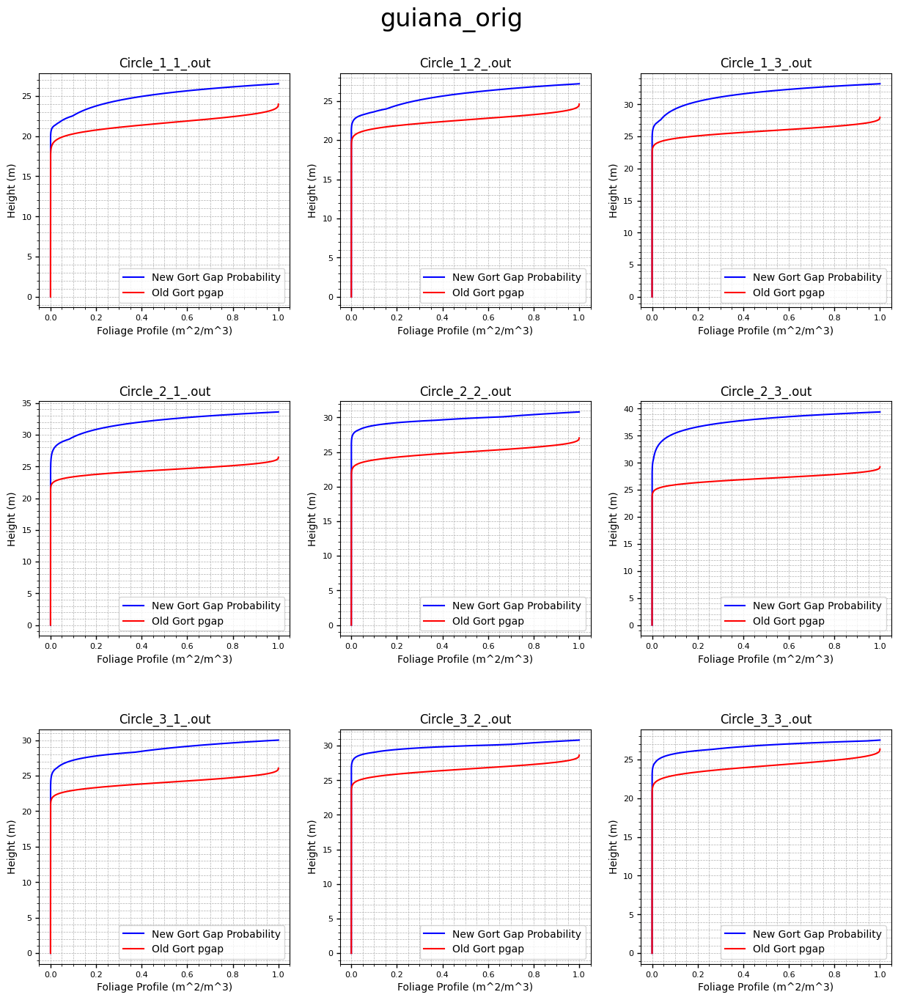

Circle_1_1_branch guiana_orig_with_branch
Circle_1_2_branch guiana_orig_with_branch
Circle_1_3_branch guiana_orig_with_branch
Circle_2_1_branch guiana_orig_with_branch
Circle_2_2_branch guiana_orig_with_branch
Circle_2_3_branch guiana_orig_with_branch
Circle_3_1_branch guiana_orig_with_branch
Circle_3_2_branch guiana_orig_with_branch
Circle_3_3_branch guiana_orig_with_branch
c:\Users\allen\OneDrive\Desktop\Work\Scripts\Lidar Simulation\IDL_plots/2024_07_01\gap_probability\guiana_orig_with_branch.pdf


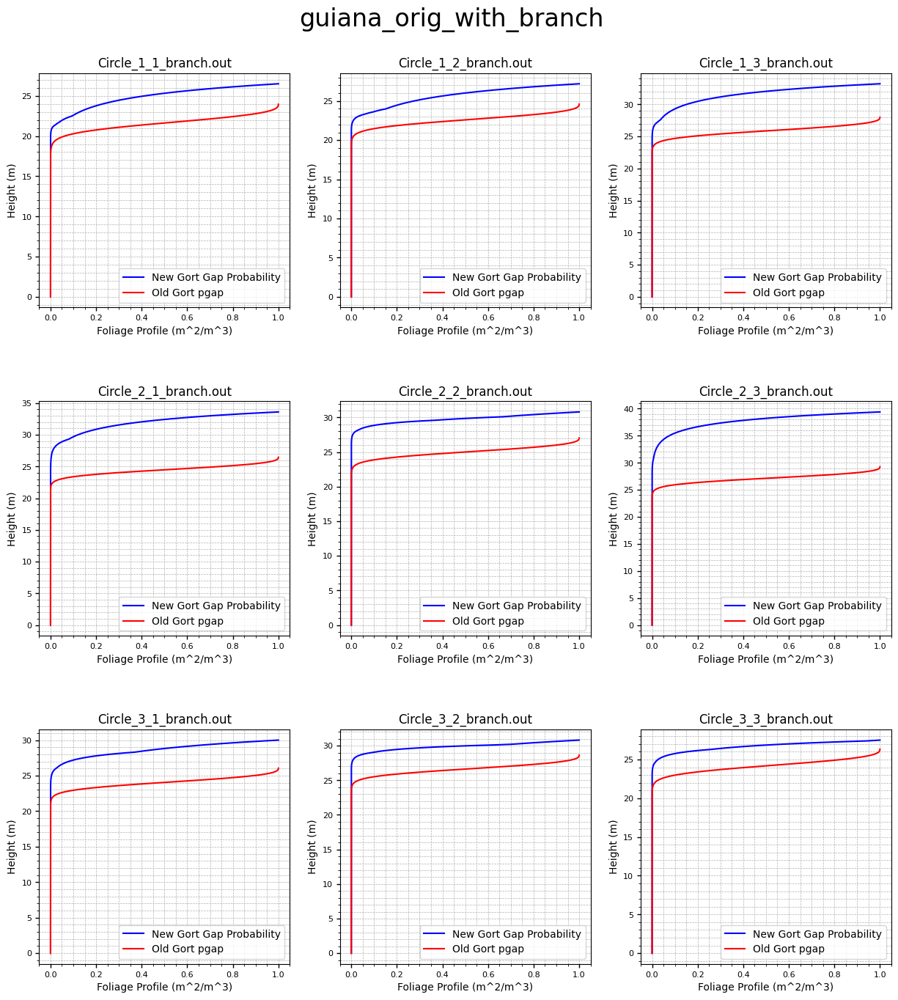

Circle_1_1_ guiana_origLD10th
Circle_1_2_ guiana_origLD10th
Circle_1_3_ guiana_origLD10th
Circle_2_1_ guiana_origLD10th
Circle_2_2_ guiana_origLD10th
Circle_2_3_ guiana_origLD10th
Circle_3_1_ guiana_origLD10th
Circle_3_2_ guiana_origLD10th
Circle_3_3_ guiana_origLD10th
c:\Users\allen\OneDrive\Desktop\Work\Scripts\Lidar Simulation\IDL_plots/2024_07_01\gap_probability\guiana_origLD10th.pdf


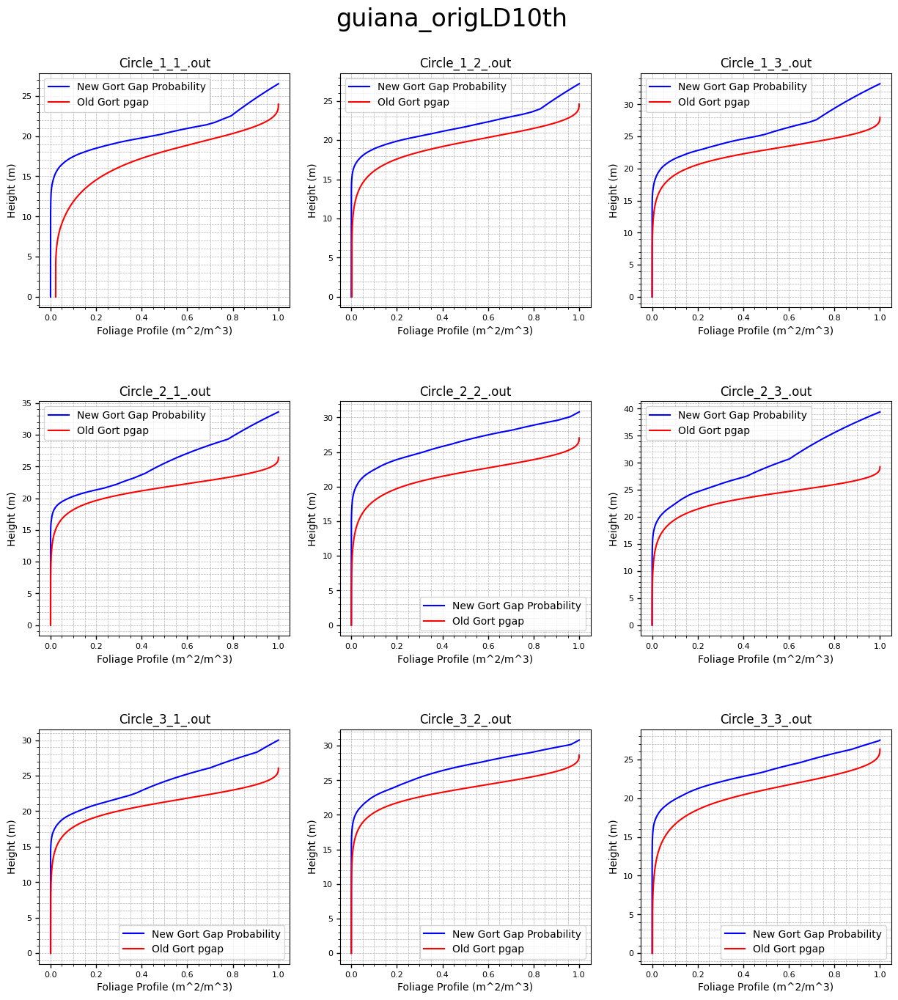

Circle_1_1_branch guiana_origLD10th_with_branch
Circle_1_2_branch guiana_origLD10th_with_branch
Circle_1_3_branch guiana_origLD10th_with_branch
Circle_2_1_branch guiana_origLD10th_with_branch
Circle_2_2_branch guiana_origLD10th_with_branch
Circle_2_3_branch guiana_origLD10th_with_branch
Circle_3_1_branch guiana_origLD10th_with_branch
Circle_3_2_branch guiana_origLD10th_with_branch
Circle_3_3_branch guiana_origLD10th_with_branch
c:\Users\allen\OneDrive\Desktop\Work\Scripts\Lidar Simulation\IDL_plots/2024_07_01\gap_probability\guiana_origLD10th_with_branch.pdf


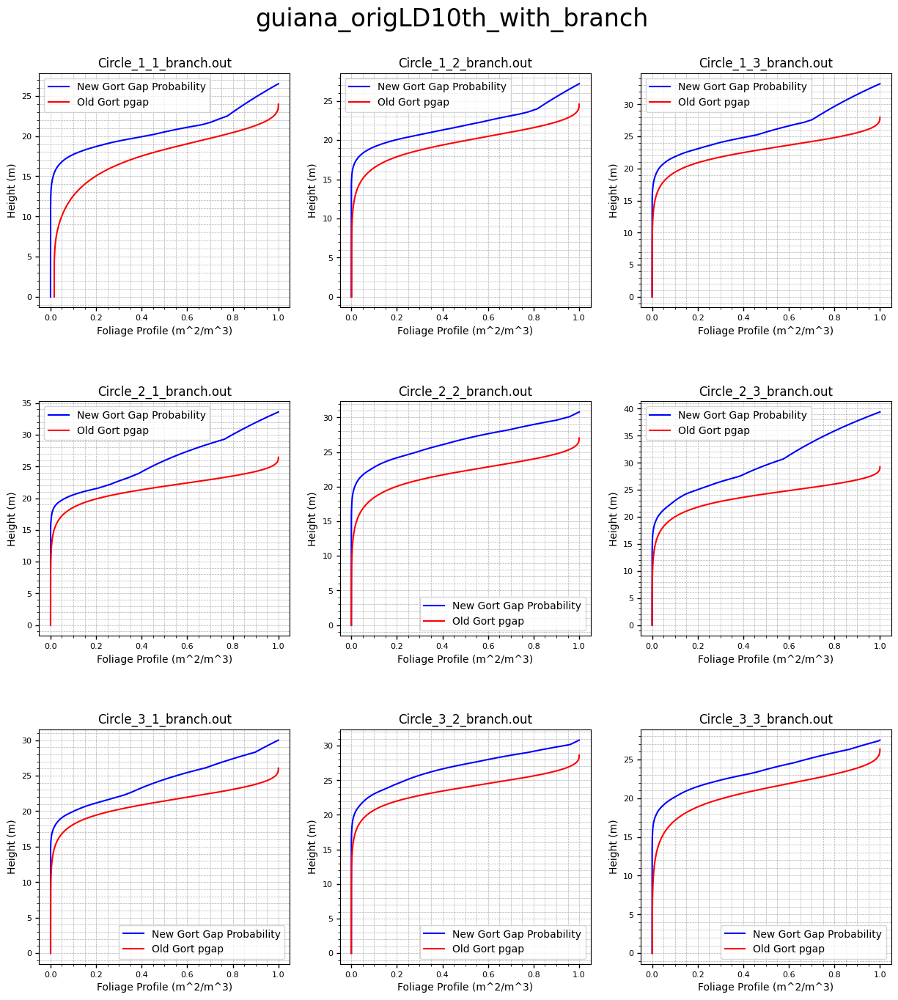

Circle_1_1_ guiana_origLD30th
Circle_1_2_ guiana_origLD30th
Circle_1_3_ guiana_origLD30th
Circle_2_1_ guiana_origLD30th
Circle_2_2_ guiana_origLD30th
Circle_2_3_ guiana_origLD30th
Circle_3_1_ guiana_origLD30th
Circle_3_2_ guiana_origLD30th
Circle_3_3_ guiana_origLD30th
c:\Users\allen\OneDrive\Desktop\Work\Scripts\Lidar Simulation\IDL_plots/2024_07_01\gap_probability\guiana_origLD30th.pdf


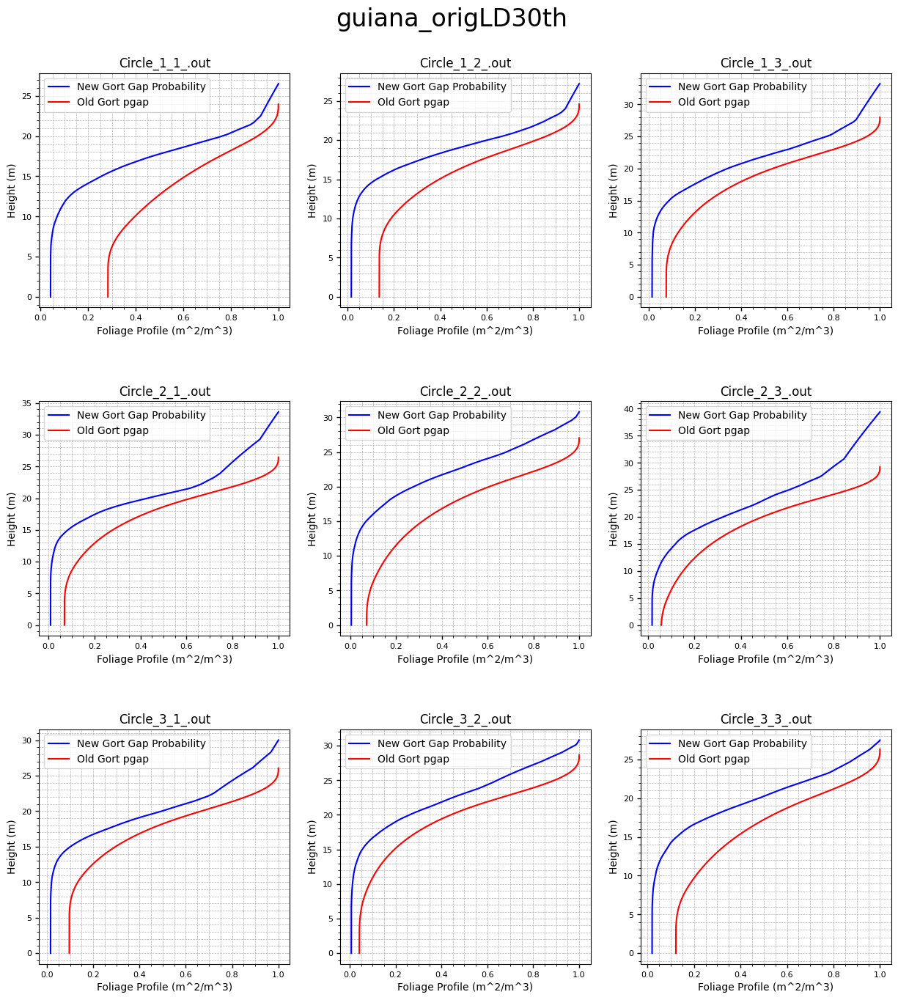

Circle_1_1_branch guiana_origLD30th_with_branch
Circle_1_2_branch guiana_origLD30th_with_branch
Circle_1_3_branch guiana_origLD30th_with_branch
Circle_2_1_branch guiana_origLD30th_with_branch
Circle_2_2_branch guiana_origLD30th_with_branch
Circle_2_3_branch guiana_origLD30th_with_branch
Circle_3_1_branch guiana_origLD30th_with_branch
Circle_3_2_branch guiana_origLD30th_with_branch
Circle_3_3_branch guiana_origLD30th_with_branch
c:\Users\allen\OneDrive\Desktop\Work\Scripts\Lidar Simulation\IDL_plots/2024_07_01\gap_probability\guiana_origLD30th_with_branch.pdf


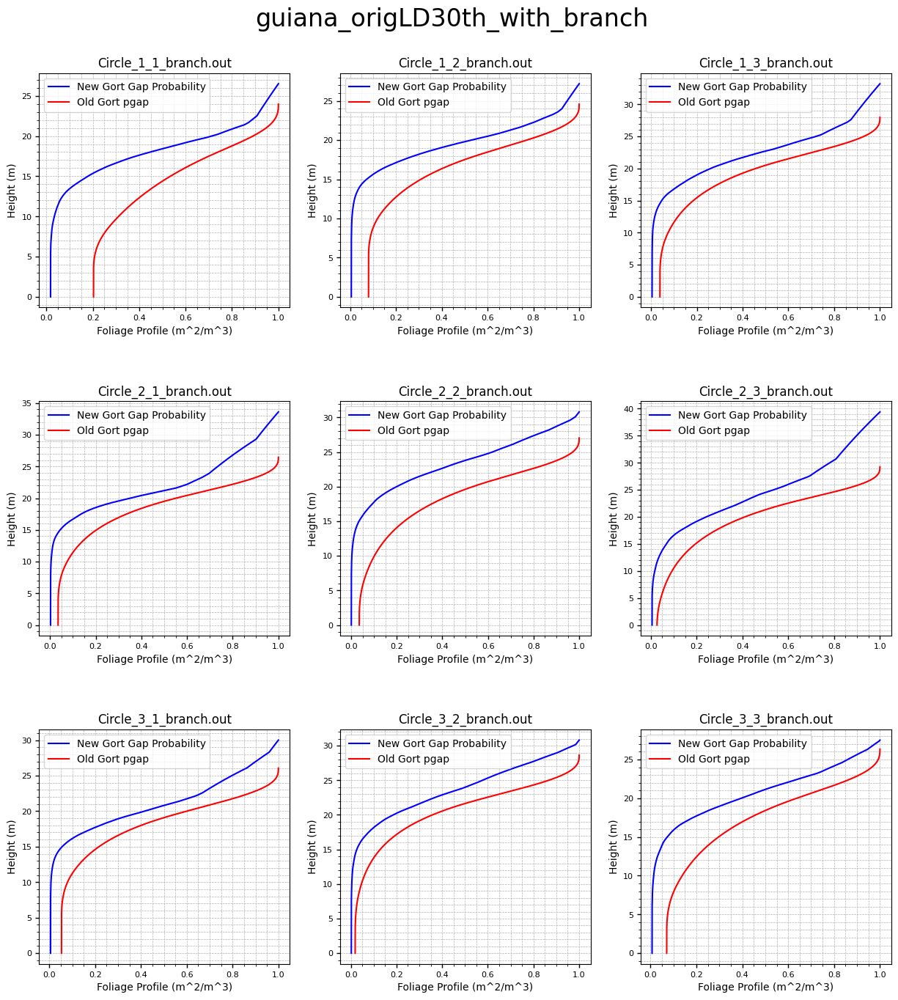

Circle_1_1_ redwood_orig
Circle_1_2_ redwood_orig
Circle_1_3_ redwood_orig
Circle_2_1_ redwood_orig
Circle_2_2_ redwood_orig
Circle_2_3_ redwood_orig
Circle_3_1_ redwood_orig
Circle_3_2_ redwood_orig
Circle_3_3_ redwood_orig
c:\Users\allen\OneDrive\Desktop\Work\Scripts\Lidar Simulation\IDL_plots/2024_07_01\gap_probability\redwood_orig.pdf


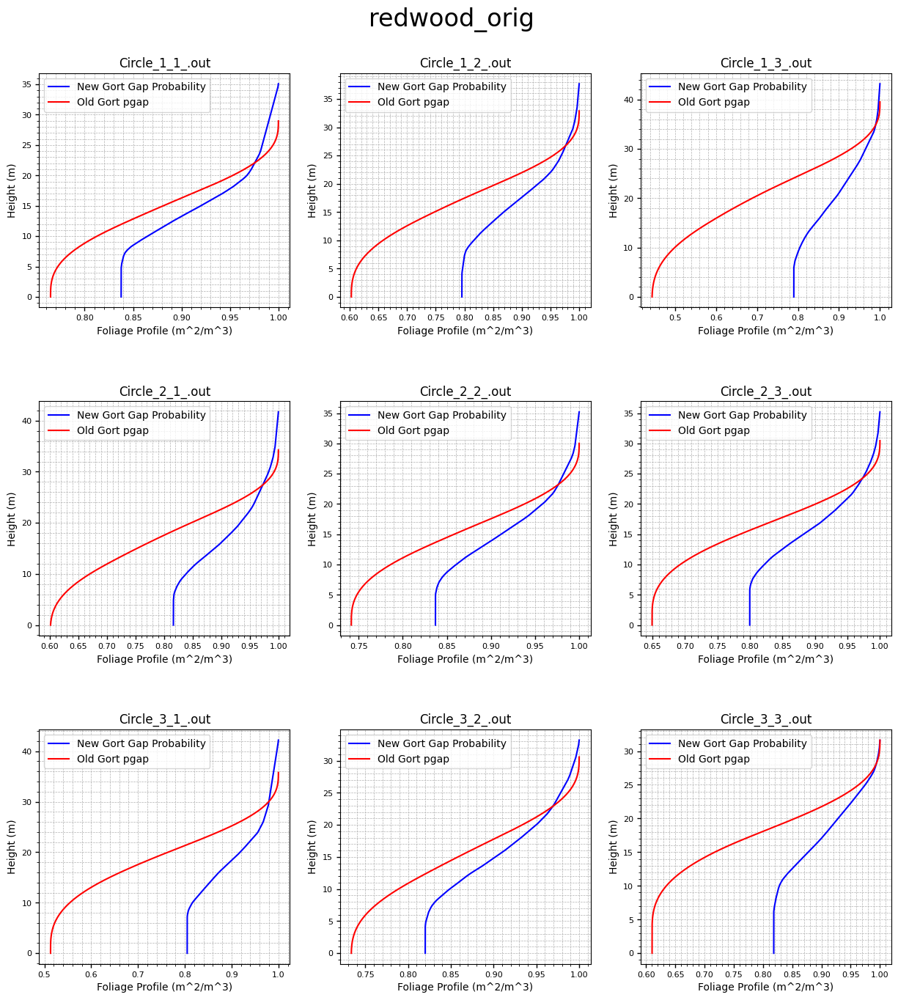

Circle_1_1_branch redwood_orig_with_branch
Circle_1_2_branch redwood_orig_with_branch
Circle_1_3_branch redwood_orig_with_branch
Circle_2_1_branch redwood_orig_with_branch
Circle_2_2_branch redwood_orig_with_branch
Circle_2_3_branch redwood_orig_with_branch
Circle_3_1_branch redwood_orig_with_branch
Circle_3_2_branch redwood_orig_with_branch
Circle_3_3_branch redwood_orig_with_branch
c:\Users\allen\OneDrive\Desktop\Work\Scripts\Lidar Simulation\IDL_plots/2024_07_01\gap_probability\redwood_orig_with_branch.pdf


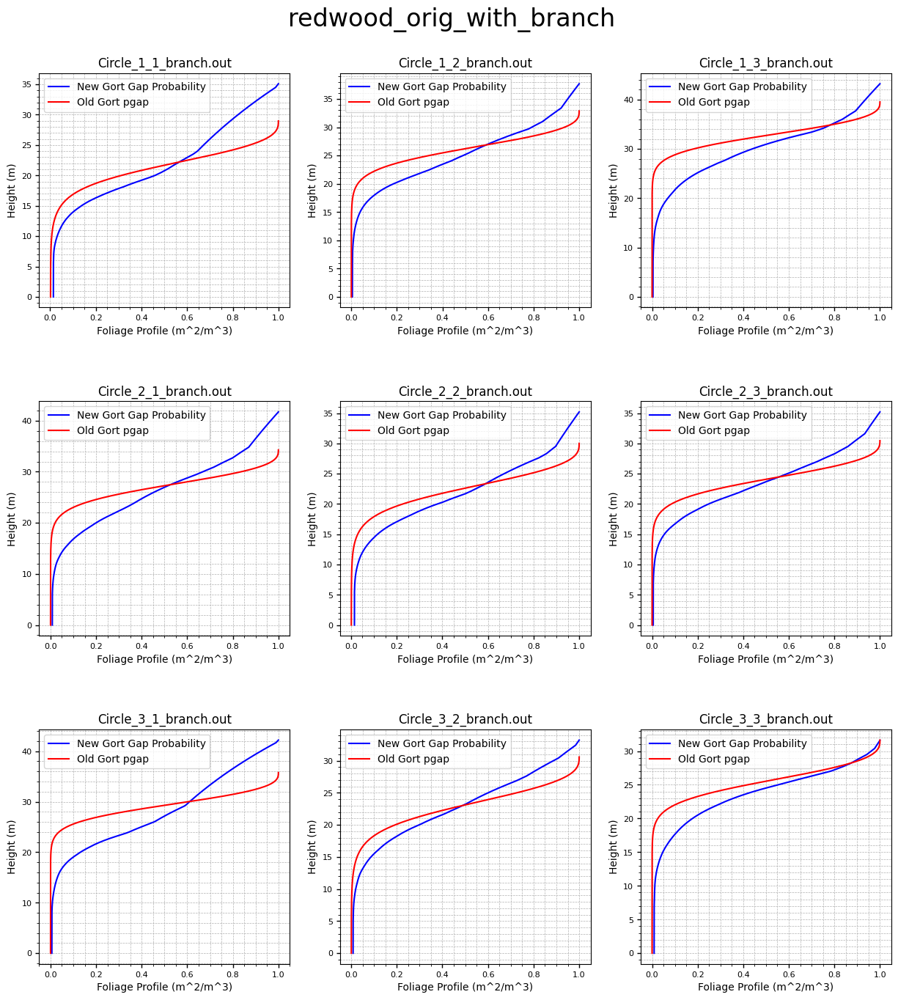

Circle_1_1_ redwood_origB10th
Circle_1_2_ redwood_origB10th
Circle_1_3_ redwood_origB10th
Circle_2_1_ redwood_origB10th
Circle_2_2_ redwood_origB10th
Circle_2_3_ redwood_origB10th
Circle_3_1_ redwood_origB10th
Circle_3_2_ redwood_origB10th
Circle_3_3_ redwood_origB10th
c:\Users\allen\OneDrive\Desktop\Work\Scripts\Lidar Simulation\IDL_plots/2024_07_01\gap_probability\redwood_origB10th.pdf


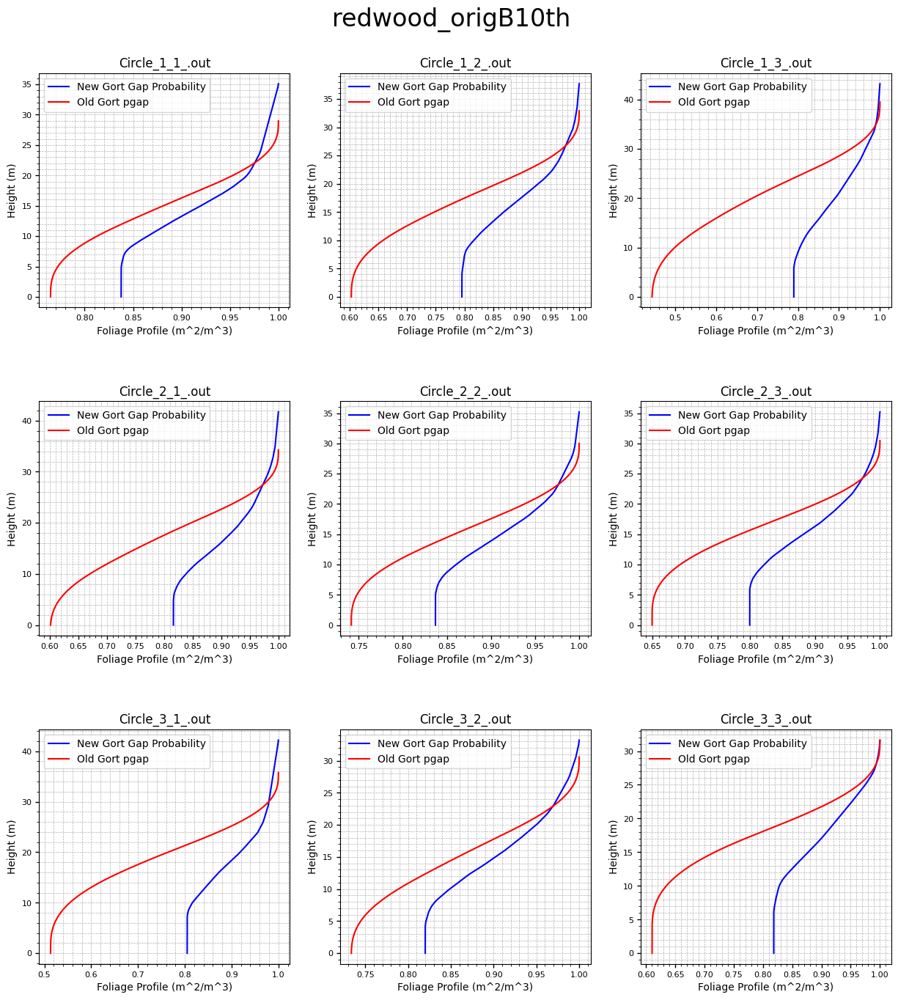

Circle_1_1_branch redwood_origB10th_with_branch
Circle_1_2_branch redwood_origB10th_with_branch
Circle_1_3_branch redwood_origB10th_with_branch
Circle_2_1_branch redwood_origB10th_with_branch
Circle_2_2_branch redwood_origB10th_with_branch
Circle_2_3_branch redwood_origB10th_with_branch
Circle_3_1_branch redwood_origB10th_with_branch
Circle_3_2_branch redwood_origB10th_with_branch
Circle_3_3_branch redwood_origB10th_with_branch
c:\Users\allen\OneDrive\Desktop\Work\Scripts\Lidar Simulation\IDL_plots/2024_07_01\gap_probability\redwood_origB10th_with_branch.pdf


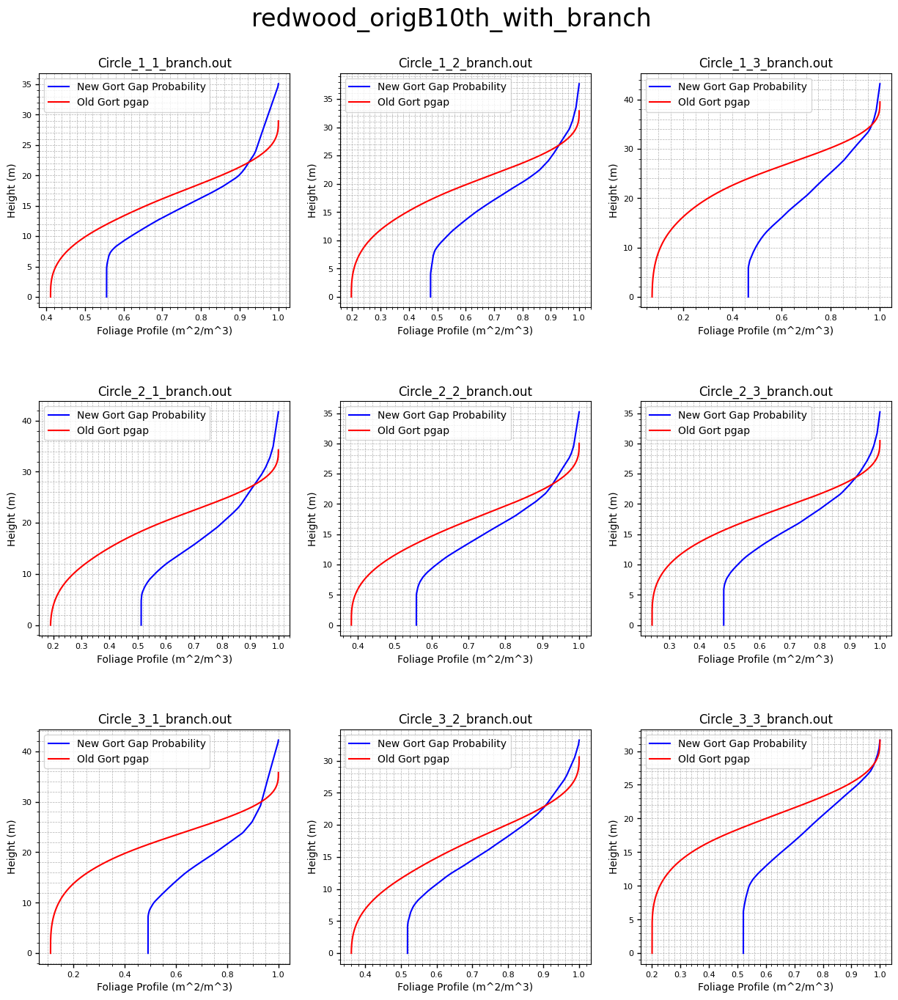

In [49]:
generate_pgap_plots('C:/Users/allen/OneDrive/Desktop/Work/Scripts/Lidar Simulation/OrigGORTOutput/2024_07_01', 'IDL_plots/')